# Analysis of nutritional information on common foods ('common' at least in a typical Western diet)

The idea of this project is to see how macronutrients are distributed in different food groups typical of a western diet.

## Libraries

In [1]:
import pandas as pd
pd.options.display.max_columns=100
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from scipy.stats.mstats import winsorize
import warnings
warnings.filterwarnings("ignore")
import re
import spacy
from wordcloud import WordCloud
import plotly.express as px
from math import pi
#from matplotlib.projections import register_projection
#from matplotlib.patches import Polygon


## Upload dataset 

In [2]:
df_nutrientes= pd.read_csv('nutrition.csv')

## Info

In [3]:
df_nutrientes.head()

,Unnamed: 0,name,serving_size,calories,total_fat,saturated_fat,cholesterol,sodium,choline,folate,folic_acid,niacin,pantothenic_acid,riboflavin,thiamin,vitamin_a,vitamin_a_rae,carotene_alpha,carotene_beta,cryptoxanthin_beta,lutein_zeaxanthin,lucopene,vitamin_b12,vitamin_b6,vitamin_c,vitamin_d,vitamin_e,tocopherol_alpha,vitamin_k,calcium,copper,irom,magnesium,manganese,phosphorous,potassium,selenium,zink,protein,alanine,arginine,aspartic_acid,cystine,glutamic_acid,glycine,histidine,hydroxyproline,isoleucine,leucine,lysine,methionine,phenylalanine,proline,serine,threonine,tryptophan,tyrosine,valine,carbohydrate,fiber,sugars,fructose,galactose,glucose,lactose,maltose,sucrose,fat,saturated_fatty_acids,monounsaturated_fatty_acids,polyunsaturated_fatty_acids,fatty_acids_total_trans,alcohol,ash,caffeine,theobromine,water
0,0,Cornstarch,100 g,381,0.1g,NaN,0,9.00 mg,0.4 mg,0.00 mcg,0.00 mcg,0.000 mg,0.000 mg,0.000 mg,0.000 mg,0.00 IU,0.00 mcg,0.00 mcg,0.00 mcg,0.00 mcg,0.00 mcg,0,0.00 mcg,0.000 mg,0.0 mg,0.00 IU,0.00 mg,0.00 mg,0.0 mcg,2.00 mg,0.050 mg,0.47 mg,3.00 mg,0.053 mg,13.00 mg,3.00 mg,2.8 mcg,0.06 mg,0.26 g,0.019 g,0.012 g,0.020 g,0.006 g,0.053 g,0.009 g,0.008 g,0,0.010 g,0.036 g,0.006 g,0.006 g,0.013 g,0.024 g,0.012 g,0.009 g,0.001 g,0.010 g,0.014 g,91.27 g,0.9 g,0.00 g,0,0,0,0,0,0,0.05 g,0.009 g,0.016 g,0.025 g,0.00 mg,0.0 g,0.09 g,0.00 mg,0.00 mg,8.32 g
1,1,"Nuts, pecans",100 g,691,72g,6.2g,0,0.00 mg,40.5 mg,22.00 mcg,0.00 mcg,1.167 mg,0.863 mg,0.130 mg,0.660 mg,56.00 IU,3.00 mcg,0.00 mcg,29.00 mcg,9.00 mcg,17.00 mcg,0,0.00 mcg,0.210 mg,1.1 mg,0.00 IU,1.40 mg,1.40 mg,3.5 mcg,70.00 mg,1.200 mg,2.53 mg,121.00 mg,4.500 mg,277.00 mg,410.00 mg,3.8 mcg,4.53 mg,9.17 g,0.397 g,1.177 g,0.929 g,0.152 g,1.829 g,0.453 g,0.262 g,0,0.336 g,0.598 g,0.287 g,0.183 g,0.426 g,0.363 g,0.474 g,0.306 g,0.093 g,0.215 g,0.411 g,13.86 g,9.6 g,3.97 g,0.04 g,0,0.04 g,0.00 g,0.00 g,3.90 g,71.97 g,6.180 g,40.801 g,21.614 g,0.00 mg,0.0 g,1.49 g,0.00 mg,0.00 mg,3.52 g
2,2,"Eggplant, raw",100 g,25,0.2g,NaN,0,2.00 mg,6.9 mg,22.00 mcg,0.00 mcg,0.649 mg,0.281 mg,0.037 mg,0.039 mg,23.00 IU,1.00 mcg,0.00 mcg,14.00 mcg,0.00 mcg,36.00 mcg,0,0.00 mcg,0.084 mg,2.2 mg,0.00 IU,0.30 mg,0.30 mg,3.5 mcg,9.00 mg,0.081 mg,0.23 mg,14.00 mg,0.232 mg,24.00 mg,229.00 mg,0.3 mcg,0.16 mg,0.98 g,0.051 g,0.057 g,0.164 g,0.006 g,0.186 g,0.041 g,0.023 g,0,0.045 g,0.064 g,0.047 g,0.011 g,0.043 g,0.043 g,0.042 g,0.037 g,0.009 g,0.027 g,0.053 g,5.88 g,3.0 g,3.53 g,1.54 g,0,1.58 g,0,0,0.26 g,0.18 g,0.034 g,0.016 g,0.076 g,0.00 mg,0.0 g,0.66 g,0.00 mg,0.00 mg,92.30 g
3,3,"Teff, uncooked",100 g,367,2.4g,0.4g,0,12.00 mg,13.1 mg,0,0,3.363 mg,0.942 mg,0.270 mg,0.390 mg,9.00 IU,0.00 mcg,0.00 mcg,5.00 mcg,0.00 mcg,66.00 mcg,0,0,0.482 mg,0,0,0.08 mg,0.08 mg,1.9 mcg,180.00 mg,0.810 mg,7.63 mg,184.00 mg,9.240 mg,429.00 mg,427.00 mg,4.4 mcg,3.63 mg,13.30 g,0.747 g,0.517 g,0.820 g,0.236 g,3.349 g,0.477 g,0.301 g,0,0.501 g,1.068 g,0.376 g,0.428 g,0.698 g,0.664 g,0.622 g,0.510 g,0.139 g,0.458 g,0.686 g,73.13 g,8.0 g,1.84 g,0.47 g,0.00 g,0.73 g,0.00 g,0.01 g,0.62 g,2.38 g,0.449 g,0.589 g,1.071 g,0,0,2.37 g,0,0,8.82 g
4,4,"Sherbet, orange",100 g,144,2g,1.2g,1mg,46.00 mg,7.7 mg,4.00 mcg,0.00 mcg,0.063 mg,0.224 mg,0.097 mg,0.027 mg,46.00 IU,12.00 mcg,0.00 mcg,1.00 mcg,5.00 mcg,7.00 mcg,0,0.13 mcg,0.023 mg,2.3 mg,0.00 IU,0.01 mg,0.01 mg,0.0 mcg,54.00 mg,0.028 mg,0.14 mg,8.00 mg,0.011 mg,40.00 mg,96.00 mg,1.5 mcg,0.48 mg,1.10 g,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,30.40 g,1.3 g,24.32 g,0,0,0,0,0,0,2.00 g,1.160 g,0.530 g,0.080 g,1.00 mg,0.0 g,0.40 g,0.00 mg,0.00 mg,66.10 g


In [4]:
df_nutrientes.shape

(8789, 77)

In [5]:
df_nutrientes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8789 entries, 0 to 8788
Data columns (total 77 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Unnamed: 0                   8789 non-null   int64 
 1   name                         8789 non-null   object
 2   serving_size                 8789 non-null   object
 3   calories                     8789 non-null   int64 
 4   total_fat                    8789 non-null   object
 5   saturated_fat                7199 non-null   object
 6   cholesterol                  8789 non-null   object
 7   sodium                       8789 non-null   object
 8   choline                      8789 non-null   object
 9   folate                       8789 non-null   object
 10  folic_acid                   8789 non-null   object
 11  niacin                       8789 non-null   object
 12  pantothenic_acid             8789 non-null   object
 13  riboflavin                   8789

In [6]:
#for col in df_nutrientes.columns:
#    print(col, df_nutrientes[col].unique(),'\n', 50*'*')

**Topics to adjust prior to visualizations:**
* A) Eliminate columns that we are not going to use:
1. The column 'Unnamed: 0' has the identifier code of the food. Does not add anything to our analysis
1. 'serving_size' always contains the same value (100g). It does not contribute anything by itself
1. 'lucopene' always contains the same value (0).
1. 'Total_fat' represents almost the same value as 'fat'
1. 'saturated_fat' represents almost the same value as 'saturated_fatty_acids'
1. 'tocopherol_alfa" we take as a synonym for vitamin E (which already exists as another field, so we removed tocopherol)
1. Eliminate from the data set all those foods that mention brands, since in some cases they are very repetitive.
* B) Data type: convert variables to numeric:
1. All values are expressed together with their unit of measure (g=grams, mg=milligrams, mcg=micrograms, IU=international units). This can cause a problem later because they are str and not numeric.

* C) Changing the names of calculated variables and columns:
1. Assign each column name its unit of measure.



## Elimination of columns that we are not going to use

In [7]:
df=df_nutrientes.drop(['name','Unnamed: 0', 'serving_size', 'lucopene', 'total_fat','saturated_fat', 'tocopherol_alpha'], axis=1)

## Rename columns

In [8]:
# We eliminate the characters that are not numbers or '.'.
df = df.astype(str)
for columna in df.columns:
    df[columna] = df[columna].str.replace(r'[^\d\.]+', '')

In [9]:
df= df.rename(columns={
    'calories':'calories_100g' ,
    'cholesterol':'cholesterol_mg',
    'sodium':'sodium_mg' ,
    'choline':'choline_mg',
    'folate':'folate_mcg' ,
    'folic_acid':'folic_acid_mcg' ,
    'niacin':'niacin_mg' ,
    'pantothenic_acid':'pantothenic_acid_mg' ,
    'riboflavin':'riboflavin_mg' ,
    'thiamin':'thiamin_mg' ,
    'vitamin_a':'vitamin_a_IU' ,
    'vitamin_a_rae':'vitamin_a_rae_mcg' ,
    'carotene':'carotene_alpha_mcg' ,
    'carotene_beta':'carotene_beta_mcg' ,
    'cryptoxanthin_beta': 'cryptoxanthin_beta_mcg',
    'lutein_zeaxanthin':'lutein_zeaxanthin_mcg' ,
    'vitamin_b12':'vitamin_b12_mcg',
    'vitamin_b6':'vitamin_b6_mg',
    'vitamin_c':'vitamin_c_mg',
    'vitamin_d':'vitamin_d_IU',
    'vitamin_e':'vitamin_e_mg',
    'vitamin_k':'vitamin_k_mcg',
    'calcium':'calcium_mg',
    'copper':'copper_mg',
    'irom':'iron_mg' ,
    'magnesium':'magnesium_mg',
    'manganese':'manganese_mg',
    'phosphorous':'phosphorous_mg',
    'potassium':'potassium_mg',
    'selenium':'selenium_mcg',
    'zink':'zink_mg',
    'protein':'protein_g',
    'alanine':'alanine_g',
    'arginine':'arginine_g',
    'aspartic_acid':'aspartic_acid_g',
    'cystine':'cystine_g',
    'glutamic_acid':'glutamic_acid_g',
    'glycine':'glycine_g',
    'histidine':'histidine_g',
    'hydroxyproline':'hydroxyproline_g',
    'isoleucine':'isoleucine_g',
    'leucine':'leucine_g',
    'lysine':'lysine_g',
    'methionine':'methionine_g',
    'phenylalanine':'phenylalanine_g',
    'proline':'proline_g',
    'serine':'serine_g',
    'threonine':'threonine_g',
    'tryptophan':'tryptophan_g',
    'tyrosine':'tyrosine_g',
    'valine':'valine_g',
    'carbohydrate': 'carbohydrate_g',
    'fiber':'fiber_g',
    'sugars':'sugars_g',
    'fructose':'fructose_g',
    'galactose':'galactose_g',
    'glucose':'glucose_g',
    'lactose':'lactose_g',
    'maltose':'maltose_g',
    'sucrose':'sucrose_g',
    'fat':'fat_g',
    'saturated_fatty_acids':'saturated_fatty_acids_g',
    'monounsaturated_fatty_acids':'monounsaturated_fatty_acids_g',
    'polyunsaturated_fatty_acids':'polyunsaturated_fatty_acids_g',
    'fatty_acids_total_trans':'fatty_acids_total_trans_mg',
    'alcohol':'alcohol_g',
    'ash':'ash_g',
    'caffeine':'caffeine_mg',
    'theobromine':'theobromine_mg',
    'water':'water_g'
  })

In [10]:
df=df.astype(float)

In [11]:
df.insert(0, 'name', df_nutrientes['name'])

## Drop duplicates

In [12]:
df= df.drop_duplicates()

# Percentage of caloric intake, for each macronutrient

Taking into account the calories provided by each macronutrient per gram, we can calculate the percentage of total energy provided by each one in a certain food.

In [13]:
df['proteina_porcentaje']= (df['protein_g']*4)/df['calories_100g']
df['carbs_porcentaje']= (df['carbohydrate_g']*4)/df['calories_100g']
df['grasa_porcentaje']= (df['fat_g']*9)/df['calories_100g']

## Create calculated columns

### Proteins

In [14]:
#Essential amino acids are those that the body itself cannot synthesize on its own
df['aminoacidos_esenciales']= (df['histidine_g'] + df['isoleucine_g'] +df['leucine_g'] + df['lysine_g'] + df['methionine_g']+ df['phenylalanine_g']+ df['threonine_g']+ df['tryptophan_g'] + df['valine_g'])

#Essential amino acids are those that the body itself can synthesize on its own
df['aas_no_esenciales']= (df['alanine_g']+ df['aspartic_acid_g']+ df['cystine_g']+ df['glutamic_acid_g']+ df['glycine_g']+ df['proline_g']+ df['serine_g']+ df['tyrosine_g']+ df['hydroxyproline_g'])

#BCAAs are called the set of branched-chain amino acids, which is made up of leucine, isoleucine and valine.
df['BCAA_g']= (df['isoleucine_g'] + df['leucine_g'] + df['valine_g'])


### Fats

In [15]:
df['grasas_insaturadas_g']= df['monounsaturated_fatty_acids_g']+ df['polyunsaturated_fatty_acids_g']

### Carbohydrates

No need to create any column

### Quartiles

In [16]:
df[['carbohydrate_g', 'protein_g', 'fat_g']].describe(percentiles=[0.25,0.5, 0.75, 0.95]).T

,count,mean,std,min,25%,50%,75%,95%,max
carbohydrate_g,8789.0,22.121915,27.266261,0.0,0.05,9.34,34.91,78.686,100.00
protein_g,8789.0,11.345616,10.530602,0.0,2.38,8.02,19.88,29.092,88.32
fat_g,8789.0,10.550794,15.814870,0.0,0.95,5.13,13.72,34.600,100.00


## Create quartile plots

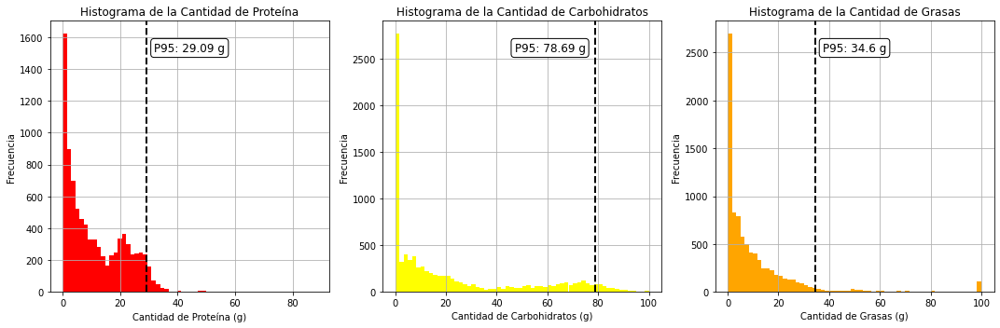

In [17]:
#Create the percentils
p95carbs= np.percentile(df['carbohydrate_g'], 95).round(2)
p95prot= np.percentile(df['protein_g'], 95).round(2)
p95fat= np.percentile(df['fat_g'], 95).round(2)

# Create subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

# Graph 1: Amount of Protein
axes[0].hist(df['protein_g'], bins=60, color='red')
axes[0].axvline(p95prot, color='black', linestyle='dashed', linewidth=2)
axes[0].grid()
axes[0].set_xlabel('Cantidad de Proteína (g)')
axes[0].set_ylabel('Frecuencia')
axes[0].set_title('Histograma de la Cantidad de Proteína')
axes[0].text(0.5, 0.9, f'P95: {p95prot} g', ha='center', va='center', transform=axes[0].transAxes, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))


# Graph 2: Amount of Carbs
axes[1].hist(df['carbohydrate_g'], bins=60, color='yellow')
axes[1].axvline(p95carbs, color='black', linestyle='dashed', linewidth=2)
axes[1].grid()
axes[1].set_xlabel('Cantidad de Carbohidratos (g)')
axes[1].set_ylabel('Frecuencia')
axes[1].set_title('Histograma de la Cantidad de Carbohidratos')
axes[1].text(0.6, 0.9, f'P95: {p95carbs} g', ha='center', va='center', transform=axes[1].transAxes, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))


# Graph 3: Amount of Fats
axes[2].hist(df['fat_g'], bins=60, color='orange')
axes[2].axvline(p95fat, color='black', linestyle='dashed', linewidth=2)
axes[2].grid()
axes[2].set_xlabel('Cantidad de Grasas (g)')
axes[2].set_ylabel('Frecuencia')
axes[2].set_title('Histograma de la Cantidad de Grasas')
axes[2].text(0.5, 0.9, f'P95: {p95fat} g', ha='center', va='center', transform=axes[2].transAxes, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

# Ajustar la disposición de los subplots
plt.tight_layout()

# Mostrar los subplots
plt.show()

## NRF

**NRF (Nutrient Rich Foods)** is a scoring system for classifying foods based on their nutrient content and quality. <br />
It is calculated as the sum of the percentages of recommended daily values of nutrients to promote minus the sum of percentages of the maximum recommended values of nutrients to limit.<br />
There are different NRF models, which consider more or less nutrients (for example NRF9.3, NRF11.3, etc.) <br />
In this analysis, we will use the NRF15.3 (15 nutrients to promote, 3 nutrients to limit)
* **To promote (15):** protein, fiber, monounsaturated fat, vitamins (A, C, D, E, thiamin, riboflavin, B12, folate) and minerals (calcium, iron, zink, potassium).
* **To limit (3):** total sugars (in some models they take only added sugar), saturated fats and sodium.

If you are interested in learning more: <br />
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4462757/ <br />
https://academic.oup.com/jn/article/139/8/1549/4670510<br />
https://www.fda.gov/food/new-nutrition-facts-label/daily-value-new-nutrition-and-supplement-facts-labels#1

Note: to calculate this index, only the previously mentioned nutrients are taken into account as parameters. This means that the score assigned to each food is considering those nutrients and nothing else (for example, NRF15.3 does not consider trans fats as a nutrient to limit).

In [18]:
#VITAMIN D CONVERSION: 1 IU = 0.025 mcg
df['vitamin_d_IU']= df['vitamin_d_IU']*0.025 

In [19]:
df.rename(columns={'vitamin_d_IU' : 'vitamin_d_mcg'}, inplace=True)

### NRF column

In [20]:
# To calculate the NRF15.3 it is necessary to obtain the foods and their nutrients considered for 100kcal 
#in the data set the nutrients shown are expressed according to 100 grams of the food, 
#so we must first express the nutrients according to 100 kcal

df_NRF= df[['name','calories_100g','protein_g','fiber_g','monounsaturated_fatty_acids_g','vitamin_a_rae_mcg','vitamin_c_mg','vitamin_d_mcg',
                       'vitamin_e_mg','thiamin_mg','riboflavin_mg','vitamin_b12_mcg','folate_mcg',
                       'calcium_mg','iron_mg','potassium_mg','zink_mg','saturated_fatty_acids_g','sugars_g','sodium_mg']]

data = pd.DataFrame({'calorias': np.zeros(8789)})
data['calorias'] = 100
data['name'] = df_NRF['name']

data['gramos'] = data['calorias'] * 100 / df_NRF['calories_100g']
data['protein_g'] = data['gramos'] * df_NRF['protein_g'] / 100
data['fiber_g'] = data['gramos'] * df_NRF['fiber_g'] / 100
data['monounsaturated_fatty_acids_g'] = data['gramos'] * df_NRF['monounsaturated_fatty_acids_g'] / 100
data['vitamin_a_rae_mcg'] = data['gramos'] * df_NRF['vitamin_a_rae_mcg'] / 100
data['vitamin_c_mg'] = data['gramos'] * df_NRF['vitamin_c_mg'] / 100
data['vitamin_d_mcg'] = data['gramos'] * df_NRF['vitamin_d_mcg'] / 100
data['vitamin_e_mg'] = data['gramos'] * df_NRF['vitamin_e_mg'] / 100
data['thiamin_mg'] = data['gramos'] * df_NRF['thiamin_mg'] / 100
data['riboflavin_mg'] = data['gramos'] * df_NRF['riboflavin_mg'] / 100
data['vitamin_b12_mcg'] = data['gramos'] * df_NRF['vitamin_b12_mcg'] / 100
data['riboflavin_mg'] = data['gramos'] * df_NRF['riboflavin_mg'] / 100
data['folate_mcg'] = data['gramos'] * df_NRF['folate_mcg'] / 100
data['calcium_mg'] = data['gramos'] * df_NRF['calcium_mg'] / 100
data['iron_mg'] = data['gramos'] * df_NRF['iron_mg'] / 100
data['potassium_mg'] = data['gramos'] * df_NRF['potassium_mg'] / 100
data['zink_mg'] = data['gramos'] * df_NRF['zink_mg'] / 100
data['saturated_fatty_acids_g'] = data['gramos'] * df_NRF['saturated_fatty_acids_g'] / 100
data['sugars_g'] = data['gramos'] * df_NRF['sugars_g'] / 100
data['sodium_mg'] = data['gramos'] * df_NRF['sodium_mg'] / 100

In [21]:
# Finally we do the calculation, the sum of nutrients to promote (over recommended values) minus the sum of
#nutrients to limit(above maximum values) recommended and maximum daily values obtained from 
#https://www.fda.gov/food/new-nutrition-facts-label/daily-value-new-nutrition-and-supplement-facts-labels 

data['NRF15.3'] = (data['protein_g'] / 50 + data['fiber_g'] / 28 + data['monounsaturated_fatty_acids_g'] / 44 + data['vitamin_a_rae_mcg'] / 900 + data['vitamin_c_mg'] / 90 +
                 data['vitamin_d_mcg'] / 20 + data['vitamin_e_mg'] / 15 + data['thiamin_mg'] / 1.2 + data['riboflavin_mg'] / 1.3 + data['folate_mcg'] / 400 +
                 data['calcium_mg'] / 1300 + data['iron_mg'] / 18 + data['potassium_mg'] / 4700 + data['zink_mg'] / 11 - data['saturated_fatty_acids_g'] / 20 -
                 data['sugars_g'] / 125 - data['sodium_mg'] / 2300) * 100
data['NRF15.3'] = data['NRF15.3'].round(2)

In [22]:
df['NRF15.3'] = data['NRF15.3']

In [23]:
nan_NRF = df[df['NRF15.3'].isnull()]

In [24]:
df = df[~df['name'].isin(nan_NRF['name'])]

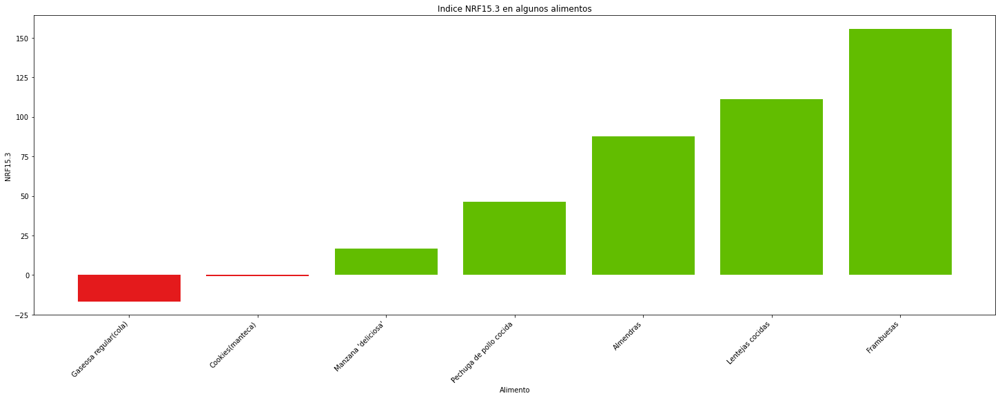

In [25]:
df_NRF_viz = df[['name', 'NRF15.3']].loc[df['name'].isin(["Beverages, regular, cola, carbonated",
                                                          "Cookies, unenriched, commercially prepared, butter",
                                                          "Apples, with skin, red delicious, raw",
                                                          "Chicken, stewed, cooked, meat and skin, breast, broilers or fryers",
                                                          "Nuts, almonds",
                                                          "Raspberries, raw",
                                                          "Lentils, without salt, stir-fried, cooked, sprouted"])]

df_NRF_viz.loc[df_NRF_viz['name'] == "Raspberries, raw", "name"] = "Frambuesas"
df_NRF_viz.loc[df_NRF_viz['name'] == "Lentils, without salt, stir-fried, cooked, sprouted", "name"] = "Lentejas cocidas"
df_NRF_viz.loc[df_NRF_viz['name'] == "Nuts, almonds", "name"] = "Almendras"
df_NRF_viz.loc[df_NRF_viz['name'] == "Chicken, stewed, cooked, meat and skin, breast, broilers or fryers", "name"] = "Pechuga de pollo cocida"
df_NRF_viz.loc[df_NRF_viz['name'] == "Apples, with skin, red delicious, raw", "name"] = "Manzana 'deliciosa'"
df_NRF_viz.loc[df_NRF_viz['name'] == "Cookies, unenriched, commercially prepared, butter", "name"] = "Cookies(manteca)"
df_NRF_viz.loc[df_NRF_viz['name'] == "Beverages, regular, cola, carbonated", "name"] = "Gaseosa regular(cola)"

df_NRF_viz = df_NRF_viz.sort_values(by='NRF15.3', ascending=True).rename(columns={"name": "Alimento"})

# Create a color gradient from red to green
color_map = mcolors.LinearSegmentedColormap.from_list('red_to_green', ['#E41A1C', '#62BD00'])
plt.figure(figsize=(25, 8))
plt.bar(df_NRF_viz['Alimento'], df_NRF_viz['NRF15.3'], color=color_map(df_NRF_viz['NRF15.3']), align='center')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Alimento')
plt.ylabel('NRF15.3')
plt.title('Indice NRF15.3 en algunos alimentos')
plt.show()


In [26]:
df[['NRF15.3']].describe(percentiles=[0.01, 0.05, 0.25,0.5, 0.75, 0.95, 0.99]).T

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
NRF15.3,8750.0,82.372493,187.4337,-1089.88,-42.8732,-10.36,20.9,49.645,87.61,283.491,667.1165,7808.89


### Winsorize

The NRF15.3 variable has both positive and negative outliers, we are going to stop them with the Winsorize function.
With the parameters entered, the function stops the values to the left of the 5th percentile and also stops the values to the right of the 95th percentile. That is, it leaves a window of 5%-95% unchanged and those that are not in that range , assigns them the maximum value corresponding to the lower or upper border.
We are going to keep the original NRF15.3 variable for the details, but for the visualizations we are going to use a new one with the Winsorize method, and in this way we manage to avoid the deletion of information that can become very valuable.
Let's also check the distribution now that we apply Winsorize to it:

In [27]:
df['NRF15.3Wins'] = winsorize(df['NRF15.3'], limits=[0.05, 0.05])

In [28]:
df[['NRF15.3Wins']].describe(percentiles=[0.01, 0.05, 0.25,0.5, 0.75, 0.95, 0.99]).T

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max
NRF15.3Wins,8750.0,68.556071,71.678231,-10.36,-10.36,-10.36,20.9,49.645,87.61,283.491,283.59,283.59


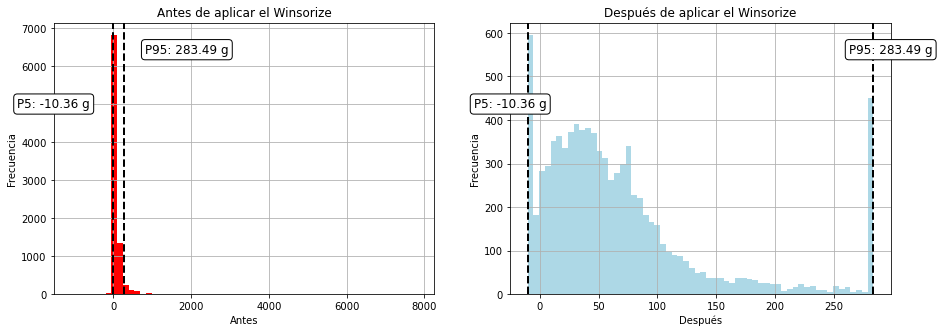

In [29]:
# Calculate percentiles
p5NRF = np.percentile(df['NRF15.3'], 5)
p95NRF = np.percentile(df['NRF15.3'], 95)
p5NRFwins = np.percentile(df['NRF15.3Wins'], 5)
p95NRFwins = np.percentile(df['NRF15.3Wins'], 95)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Histogram before Winsorize
# Graph 1: Amount of Protein
axes[0].hist(df['NRF15.3'], bins=60, color='red')
axes[0].axvline(p5NRF, color='black', linestyle='dashed', linewidth=2)
axes[0].axvline(p95NRF, color='black', linestyle='dashed', linewidth=2)
axes[0].grid()
axes[0].set_xlabel('Antes')
axes[0].set_ylabel('Frecuencia')
axes[0].set_title('Antes de aplicar el Winsorize')
axes[0].text(0.35, 0.9, f'P95: {round(p95NRF, 2)} g', ha='center', va='center', transform=axes[0].transAxes, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))
axes[0].text(0.0, 0.7, f'P5: {round(p5NRF, 2)} g', ha='center', va='center', transform=axes[0].transAxes, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

# Graph 2: Amount of Protein Winsorized
axes[1].hist(df['NRF15.3Wins'], bins=60, color='lightblue')
axes[1].axvline(p5NRFwins, color='black', linestyle='dashed', linewidth=2)
axes[1].axvline(p95NRFwins, color='black', linestyle='dashed', linewidth=2)
axes[1].grid()
axes[1].set_xlabel('Después')
axes[1].set_ylabel('Frecuencia')
axes[1].set_title('Después de aplicar el Winsorize')
axes[1].text(1.0, 0.9, f'P95: {round(p95NRFwins, 2)} g', ha='center', va='center', transform=axes[1].transAxes, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))
axes[1].text(0.0, 0.7, f'P5: {round(p5NRFwins, 2)} g', ha='center', va='center', transform=axes[1].transAxes, fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

plt.show()


# Subgroups

In [30]:
# Subgroup creation
df['Subgrupo'] = df['name'].apply(lambda x: re.sub('[^a-zA-Z ]', '', x).lower())

In [31]:
df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Pescados/mariscos" if re.search(r'\b(black sea bass|catfish|cod|flounder|freshwater trout|haddock|hake|halibut|herring|light tuna|mackerel|mullet|perch|pollock|salmon|sea bass|snapper|sole|sushi|tilapia|whiting|shellfishclams|crab|crayfish|lobster|mussels|octopus|oysters|scallops|shrimp|squid|canned fish|anchovies|freshwater trout|herring|light tuna|salmon|sardines|oyster|fish|seafood|tuna|sardine|whale|squid|mussels|clams|mollusks)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Carnes" if re.search(r'\b(beef|goat|ham|lamb|pork|turkey|game|bear|bison|deer|elk|moose|opossum|rabbit|veal|raccoon|squirrel|venison|brain|chitterlings|giblets|gizzard|heart|kidney|liver|stomach|sweetbreads|tongue|tripe)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Aves de corral" if re.search(r'\b(chicken|cornish hen|dove|duck|goose|ostrich|pheasant|quail|turkey|emu)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Huevos" if re.search(r'^egg\b|chicken eggs|duck eggs', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Productos de Soja" if re.search(r'\b(tempeh|texturized vegetable protein \(TVP\)|tofu|TVP|texturized vegetable protein)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Frutos secos" if re.search(r'\b(almonds|almond butter|brazil nuts|cashew butter|cashews|chestnuts|chia seeds|flax seeds|hazelnuts \(filberts\)|macadamia nuts|mixed nuts|peanut butter|peanuts|pecans|pine nuts|pistachios|pumpkin seeds|sesame butter or paste \(tahini\)|sesame seeds|sunflower butter|sunflower seeds|walnuts|nuts)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Lácteos" if re.search(r'^cheese\b|^yogurt\b|^milk\b|^butter\b|buttermilk|ice-cream|ice cream|smoothie|pudding|kefir', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Frutas" if re.search(r'\b(watermelon|bananas|apples|oranges|grapes|melons|peaches|papayas|pears|kiwi|lime|tangerines|papayas|blueberries|cherries|pineapple|passion fruit|grapefruit|figs|cranberries|lemon|mango|pomegranate|pumpkin|lychee|apricots)\b', x, flags=re.IGNORECASE) and re.search(r'\braw\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Vegetales verdes" if re.search(r'\b(amaranth leaves|arugula \(rocket\)|basil|beet greens|bitter melon leaves|bok choy|broccoli|broccoli rabe \(rapini\)|broccolini|chamnamul|chard|chrysanthemum leaves|cilantro|collard greens|cress|dandelion greens|dark green leafy lettuce|endive|escarole|kale|lambsquarters|mesclun|mixed greens|mustard greens|nettles|poke greens|romaine lettuce|spinach|swiss chard|taro leaves|turnip greens|watercress|lettuce)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Vegetales rojos y naranjas" if re.search(r'\b(acorn squash|butternut squash|calabaza|carrots|hubbard squash|kabocha squash|pimento/pimiento|pumpkin|red and orange bell peppers|red chili peppers|red peppers, sweet|sweet potatoes|tomatoes|100 vegetable juice|winter squash|squash|bell pepper|orange bell pepper|red bell pepper)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Vegetales almidonados" if re.search(r'\b(breadfruit|burdock root|cassava|^corn|fufu|green bananas|hominy|jicama|lotus root|parsnips|plantains|potatoes|salsify|tapioca|taro root \(dasheen or yautia\)|water chestnuts|yams|yucca|sweet potatoes|sweet potato)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Frijoles" if re.search(r'\b(beans|frijoles|peas|lentils|hummus|chickpeas|chickpea|soybeans|pigeonpeas|cowpeas|lupins|mothbeans)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Otros vegetales" if re.search(r'\b(alfalfa sprouts|arrowroot|artichokes|asparagus|avocado|bamboo shoots|bean sprouts|beets|bitter melon \(bitter gourd, balsam pear\)|broccoflower|brussels sprouts|cabbage|cactus pads \(nopales\)|cauliflower|cauliflower,|celeriac|celery|chayote \(mirliton\)|chives|cucumbers|daikon|drumstick pods \(moringa\)|eggplant|fennel bulb|fiddlehead ferns|garlic|ginger root|green peppers|green beans|hearts of palm|jerusalem artichokes \(sunchokes\)|jute|kohlrabi|leeks|luffa \(chinese okra\)|mushrooms|okra|onions|pattypan squash|purslane|radicchio|radishes|red cabbage|rutabaga|seaweed|scallions|snow peas|sorrel|spaghetti squash|tomatillos|turnips|wax beans|yellow squash|zucchini)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Granos enteros" if re.search(r'\b(amaranth|barley \(not pearled\)|brown rice|buckwheat|bulgur \(cracked wheat\)|dark rye|kamut|millet|muesli|oatmeal|oats|popcorn|quinoa|rolled oats|sorghum|spelt|teff|triticale|whole grain barley|whole grain cornmeal|whole grain sorghum|whole rye|whole wheat bread|whole wheat cereal flakes|whole wheat chapati|whole wheat crackers|whole wheat pasta|whole wheat sandwich buns and rolls|whole wheat tortillas|wild rice)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Granos refinados" if re.search(r'\b(bagels|biscuits|breadcrumbs|cakes|challah bread|cookies|corn flakes|corn tortillas|cornbread|couscous|crackers, saltine|cream of rice|cream of wheat|english muffins|flour tortilla|french bread|grits|masa|matzo|naan|noodles|pancakes|pasta \(spaghetti, macaroni\)|pie/pastry crusts|pita bread|pizza crust|polenta|pretzels|ramen noodles|refined grain cereals|refined grain crackers|rice cakes|rice paper \(spring roll wrappers\)|rice vermicelli|waffles|white bread|white rice|white sandwich buns and rolls)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Aceites/grasas" if re.search(r'\b(^Fat|^Oil)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Caramelos, gaseosas, etc." if re.search(r'\b(dessert|candies|candy|gum)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Frutas" if re.search(r'\b(watermelon|bananas|apples|oranges|grapes|melons|peaches|papayas|pears|kiwi|lime|tangerines|papayas|blueberries|cherries|pineapple|passion fruit|grapefruit|figs|cranberries|lemon|mango|pomegranate|pumpkin|lychee|apricots)\b', x, flags=re.IGNORECASE) and re.search(r'\braw\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Bebidas" if re.search(r'\b(coffee|tea|alcoholic|beer|liquor|cocktail|wine)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Condimentos" if re.search(r'\b(condiments|spices|seasonings|sauces|dressings)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Bocadillos" if re.search(r'\b(snacks|chips|pretzels|popcorn|nuts|seeds|trail mix|crackers|pita chips)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Bebidas no alcohólicas" if re.search(r'\b(juice|smoothie|soda|soft drinks|beverages)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Azúcar y edulcorantes" if re.search(r'\b(sugar|syrup|honey|sweeteners|agave|maple syrup|molasses|corn syrup|brown sugar)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Postres" if re.search(r'\b(cake|pie|pastry|cookies|cupcakes|dessert|pudding|ice cream)\b', x, flags=re.IGNORECASE) else x)

df['Subgrupo'] = df['Subgrupo'].apply(lambda x: "Otros" if not re.search(r'\b(Carnes|Aves de corral|Huevos|Pescados/mariscos|Productos de Soja|Frutos secos|Lácteos|Frutas|Vegetales verdes|Vegetales rojos y naranjas|Vegetales almidonados|Frijoles|Otros vegetales|Granos enteros|Granos refinados|Aceites/grasas|Caramelos, gaseosas, etc|Frutas|Bebidas|Condimentos|Bocadillos|Bebidas no alcoholicas|Azúcar y edulcorantes|Postres)\b', x, flags=re.IGNORECASE) else x)

# Groups

In [32]:
# Groups creation

df['Grupo'] = df['Subgrupo'].map({
    'Carnes': 'Proteicos',
    'Huevos': 'Proteicos',
    'Aves de corral': 'Proteicos',
    'Pescados/mariscos': 'Proteicos',
    'Productos de Soja': 'Proteicos',
    'Frutos secos': 'Proteicos',
    'Lácteos': 'Lácteos',
    'Frutas': 'Frutas',
    'Vegetales verdes': 'Vegetales',
    'Vegetales rojos y naranjas': 'Vegetales',
    'Vegetales almidonados': 'Vegetales',
    'Frijoles': 'Vegetales',
    'Otros vegetales': 'Vegetales',
    'Aceites/grasas': 'Aceites/grasas',
    'Caramelos, gaseosas, etc.': 'Otro',
    'Granos enteros': 'Granos',
    'Granos refinados': 'Granos',
    'Otros': 'Otro',
    'Condimentos':'Otro',
    'Bocadillos': 'Otro',
    'Bebidas':'Bebidas',
    'Bebidas no alcohólicas': 'Bebidas',
    'Azúcar y edulcorantes': 'Dulces',
    'Postres': 'Dulces'
})

# Macronutrients by group 

In [33]:
# Grouping and summarizing data
df_grupo = df.groupby('Grupo').agg(
    Calorias=('calories_100g', 'mean'),
    Proteinas=('protein_g', 'mean'),
    Carbohidratos=('carbohydrate_g', 'mean'),
    Grasas=('fat_g', 'mean'),
    NRF15_3=('NRF15.3', 'mean'),
    AminEsenc=('aminoacidos_esenciales', 'mean'),
    AminNoEsenc=('aas_no_esenciales', 'mean'),
    Azucares=('sugars_g', 'mean'),
    Fibra=('fiber_g', 'mean'),
    GrasasInsaturadas=('grasas_insaturadas_g', 'mean'),
    GrasasSaturadas=('saturated_fatty_acids_g', 'mean'),
    GrasasTrans=('fatty_acids_total_trans_mg', 'mean'),
    Conteo=('Grupo', 'count')
).reset_index()

In [34]:
# Filter unwanted categories
df_grupo = df_grupo[~df_grupo['Grupo'].isin(['Otro', 'Aceites/grasas', 'Dulces','Bebidas'])]

In [35]:
df_grupo

,Grupo,Calorias,Proteinas,Carbohidratos,Grasas,NRF15_3,AminEsenc,AminNoEsenc,Azucares,Fibra,GrasasInsaturadas,GrasasSaturadas,GrasasTrans,Conteo
3,Frutas,48.600000,0.724000,12.155500,0.212833,126.618667,0.123983,0.246500,6.921167,2.041667,0.069850,0.030400,0.000000,60
4,Granos,370.814516,6.565565,60.766472,11.902056,37.907218,1.032712,1.814192,16.429315,3.666734,6.552472,4.242020,6.959677,496
5,Lácteos,219.764706,8.963585,23.616751,10.146527,36.902577,2.592933,3.238000,10.391317,0.629412,3.469810,5.761336,28.599440,357
7,Proteicos,215.763312,19.770421,5.181834,12.719713,68.168259,7.385790,8.764225,1.195099,0.568081,6.924221,4.206520,87.000000,3418
8,Vegetales,109.400217,4.682191,18.400629,2.535987,182.737766,1.330057,1.801164,2.511226,3.712907,1.571610,0.572731,1.417570,922


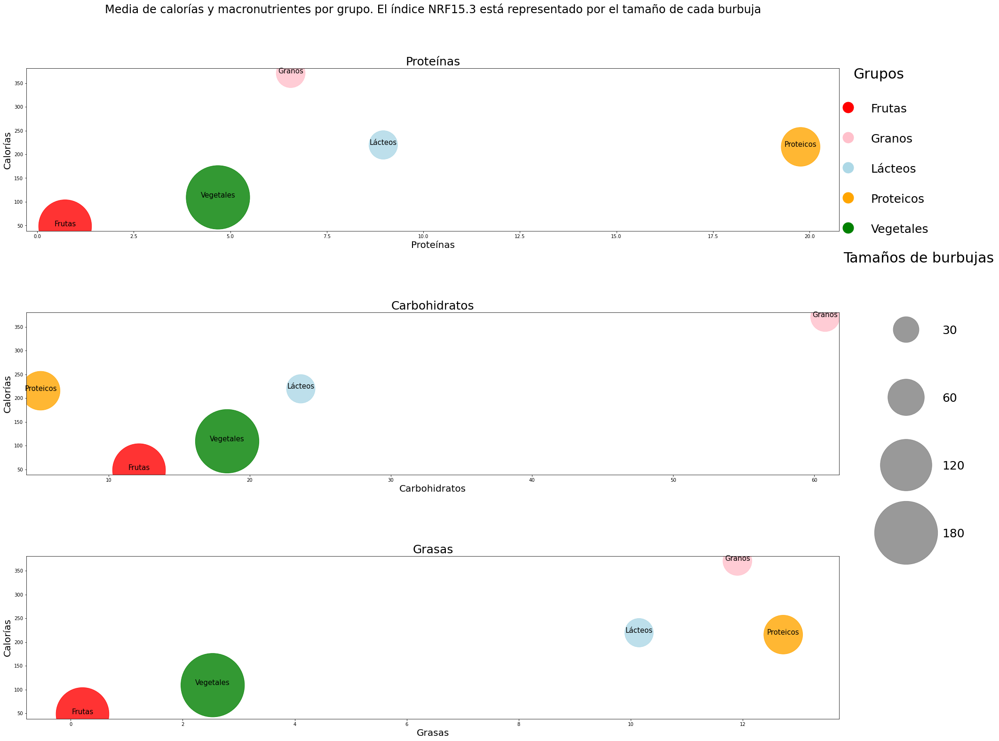

In [36]:
# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(30, 24))
params = {'xtick.labelsize': 14, 'ytick.labelsize': 14}
mpl.rcParams.update(params)

# Bubble graph

colores = ['red', 'pink', 'lightblue', 'orange', 'green']

# Proteins
axs[0].scatter(
    x=df_grupo['Proteinas'],
    y=df_grupo['Calorias'],
    s=df_grupo['NRF15_3'] * 100,
    c=colores,
    alpha=0.8
)
axs[0].set_title('Proteínas', fontsize=25)
axs[0].set_xlabel('Proteínas', fontsize=20)
axs[0].set_ylabel('Calorías', fontsize=20)
for i, row in df_grupo.iterrows():
    axs[0].text(row['Proteinas'], row['Calorias'], row['Grupo'], fontsize=15, color='black', horizontalalignment='center')

axs[0].set_xlim(df_grupo['Proteinas'].min() - 1, df_grupo['Proteinas'].max() + 1, )
axs[0].set_ylim(df_grupo['Calorias'].min() - 10, df_grupo['Calorias'].max() + 10)

# Cartbs
axs[1].scatter(
    x=df_grupo['Carbohidratos'],
    y=df_grupo['Calorias'],
    s=df_grupo['NRF15_3'] * 100,
    c=colores,
    alpha=0.8
)
axs[1].set_title('Carbohidratos', fontsize=25)
axs[1].set_xlabel('Carbohidratos', fontsize=20)
axs[1].set_ylabel('Calorías', fontsize=20)
for i, row in df_grupo.iterrows():
    axs[1].text(row['Carbohidratos'], row['Calorias'], row['Grupo'], fontsize=15, color='black', horizontalalignment='center')
axs[1].set_xlim(df_grupo['Carbohidratos'].min() - 1, df_grupo['Carbohidratos'].max() + 1)
axs[1].set_ylim(df_grupo['Calorias'].min() - 10, df_grupo['Calorias'].max() + 10)

# Fats
axs[2].scatter(
    x=df_grupo['Grasas'],
    y=df_grupo['Calorias'],
    s=df_grupo['NRF15_3'] * 100,
    c=colores,
    alpha=0.8
)
axs[2].set_title('Grasas', fontsize=25)
axs[2].set_xlabel('Grasas', fontsize=20)
axs[2].set_ylabel('Calorías', fontsize=20)
for i, row in df_grupo.iterrows():
    axs[2].text(row['Grasas'], row['Calorias'], row['Grupo'], fontsize=15, color='black', horizontalalignment='center')
axs[2].set_xlim(df_grupo['Grasas'].min() - 1, df_grupo['Grasas'].max() + 1)
axs[2].set_ylim(df_grupo['Calorias'].min() - 10, df_grupo['Calorias'].max() + 10)

# Group legend
legend_labels = ['Frutas', 'Granos', 'Lácteos', 'Proteicos', 'Vegetales']
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=25) for color in colores]
legend = axs[0].legend(legend_elements, legend_labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Grupos', labelspacing= 4, frameon= False)
legend.set_title('Grupos', prop={'size': 30})

# Bubble Sizes Legend
sizes = [30, 60, 120, 180]  
sizes_labels = ['30', '60', '120', '180']
sizes_elements = [plt.scatter([], [], s=size * 100, color='gray', alpha=0.8) for size in sizes]
sizes_legend = axs[1].legend(sizes_elements, sizes_labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Tamaños', labelspacing=12, frameon= False)
sizes_legend.set_title('Tamaños de burbujas', prop={'size': 30})

# Adjust the size of the caption title
for label in legend.get_texts():
    label.set_fontsize(25)
    label.set_va('center')
    label.set_ha('left')
    label.set_x(30)
for label in sizes_legend.get_texts():
    label.set_fontsize(25)
    label.set_va('center')
    label.set_ha('left')
    label.set_x(60)
    
# Title
fig.suptitle('Media de calorías y macronutrientes por grupo. El índice NRF15.3 está representado por el tamaño de cada burbuja', fontsize=24, color='black')

# Margin settings
plt.subplots_adjust(top=0.9, bottom=0.1, left=0.1, right=0.9, hspace=0.5)

# Show graph
plt.show()


# Macronutrients by subgroup 

## Proteins

In [37]:
df_subgrupo_prot= df[df['Grupo']=='Proteicos']

df_subgrupo_prot= df_subgrupo_prot.groupby('Subgrupo').mean()

In [38]:
df_subgrupo_prot

,calories_100g,cholesterol_mg,sodium_mg,choline_mg,folate_mcg,folic_acid_mcg,niacin_mg,pantothenic_acid_mg,riboflavin_mg,thiamin_mg,vitamin_a_IU,vitamin_a_rae_mcg,carotene_alpha,carotene_beta_mcg,cryptoxanthin_beta_mcg,lutein_zeaxanthin_mcg,vitamin_b12_mcg,vitamin_b6_mg,vitamin_c_mg,vitamin_d_mcg,vitamin_e_mg,vitamin_k_mcg,calcium_mg,copper_mg,iron_mg,magnesium_mg,manganese_mg,phosphorous_mg,potassium_mg,selenium_mcg,zink_mg,protein_g,alanine_g,arginine_g,aspartic_acid_g,cystine_g,glutamic_acid_g,glycine_g,histidine_g,hydroxyproline_g,isoleucine_g,leucine_g,lysine_g,methionine_g,phenylalanine_g,proline_g,serine_g,threonine_g,tryptophan_g,tyrosine_g,valine_g,carbohydrate_g,fiber_g,sugars_g,fructose_g,galactose_g,glucose_g,lactose_g,maltose_g,sucrose_g,fat_g,saturated_fatty_acids_g,monounsaturated_fatty_acids_g,polyunsaturated_fatty_acids_g,fatty_acids_total_trans_mg,alcohol_g,ash_g,caffeine_mg,theobromine_mg,water_g,proteina_porcentaje,carbs_porcentaje,grasa_porcentaje,aminoacidos_esenciales,aas_no_esenciales,BCAA_g,grasas_insaturadas_g,NRF15.3,NRF15.3Wins
Subgrupo,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Aves de corral,184.212851,64.744980,428.596386,25.195382,9.724900,2.078313,4.517430,0.691641,0.154819,0.094432,221.544177,19.911647,14.977912,47.451807,0.552209,17.004016,0.576205,0.244227,0.742169,0.077460,0.319076,2.278313,24.058233,0.077671,1.215402,16.937751,0.068404,142.538153,195.441767,16.516667,1.202329,15.980683,0.747659,0.816026,1.143657,0.160345,2.074918,0.772151,0.380410,0.062476,0.598504,0.979406,1.039050,0.332890,0.517104,0.678590,0.491847,0.519458,0.139088,0.420382,0.617347,7.313173,0.494980,1.078675,0.093956,0.000663,0.099337,0.009779,0.039076,0.168253,9.915161,2.697179,3.800064,2.247604,64.744980,0.0,1.714398,0.000000,0.000000,65.292129,0.374935,0.212802,0.403179,5.123257,6.552024,2.195257,6.047669,32.429920,37.774297
Carnes,206.250434,96.940972,244.826389,48.374783,15.234375,1.727431,4.952705,0.662354,0.267896,0.165295,637.943576,144.950521,8.833333,25.146701,0.500000,3.801215,2.749822,0.360456,1.206424,0.176953,0.294870,1.016667,18.279080,0.180526,2.220412,20.082031,0.316312,189.537760,281.601128,22.604080,3.765434,21.356332,1.186191,1.299482,1.708532,0.221492,3.059011,1.058070,0.677444,0.080758,0.913555,1.620811,1.747542,0.533471,0.805347,0.901910,0.797509,0.871222,0.206390,0.689602,0.998409,2.122717,0.235851,0.367487,0.020200,0.000078,0.045877,0.002270,0.013681,0.035143,12.114575,4.587811,5.017667,1.016234,96.940972,0.0,1.485208,0.000000,0.000000,63.213841,0.471319,0.058874,0.453076,8.374191,9.703075,3.532775,6.033901,75.946845,67.964236
Frutos secos,494.954545,2.550505,223.777778,18.561616,81.545455,21.636364,4.495288,0.510061,0.242152,0.292848,146.075758,22.702020,0.560606,8.318182,0.055556,42.429293,0.182424,0.320859,3.719192,0.081061,3.731364,2.870707,94.747475,0.637778,3.371919,116.227273,1.465803,249.727273,434.227273,18.445960,2.436010,12.113384,0.382788,1.014490,0.976899,0.130005,1.896490,0.483899,0.219141,0.002131,0.320076,0.600899,0.321197,0.132485,0.432470,0.411288,0.449581,0.282359,0.097768,0.283601,0.403520,38.731818,5.409091,12.845707,0.061667,0.000606,0.153687,0.000354,0.026616,1.838586,35.029242,8.301434,15.174828,8.670899,2.550505,0.0,2.118182,0.742424,7.873737,11.844091,0.095607,0.371186,0.575658,2.809914,5.016682,1.324495,23.845727,34.806566,35.920758
Huevos,277.571429,522.464286,626.107143,338.521429,75.928571,0.178571,0.311750,2.382429,0.935786,0.112071,634.821429,174.464286,14.571429,29.892857,11.464286,336.321429,1.558571,0.199357,0.310714,2.278571,1.148571,2.221429,114.035714,0.086286,2.360000,26.857143,0.058679,271.142857,351.535714,64.421429,1.663571,26.856071,1.442214,1.512250,2.458750,0.566464,3.383929,0.862893,0.596929,0.000000,1.383393,2.164750,1.752143,0.829964,1.393964,1.023393,1.862964,1.107571,0.360571,1.001536,1.664929,8.893929,0.085714,2.292500,0.046786,0.005357,0.218571,0.373929,0.106429,0.449643,14.293929,4.604964,5.625357,2.577107

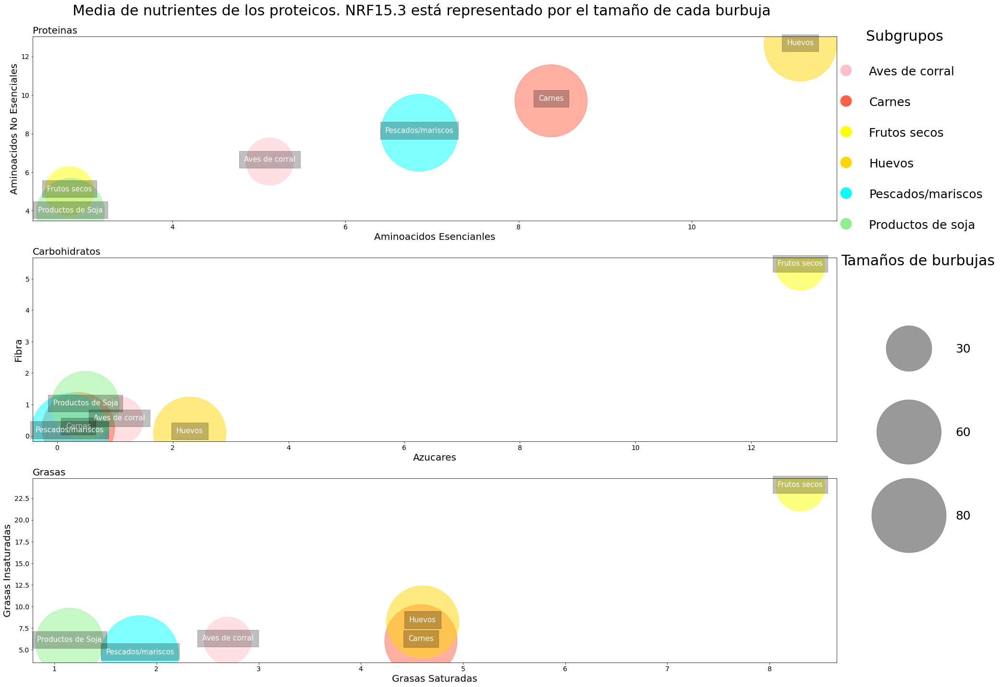

In [39]:
# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(30, 24))
params = {'xtick.labelsize': 14, 'ytick.labelsize': 14}
mpl.rcParams.update(params)
colores = ['pink','tomato', 'yellow','gold','aqua', 'lightgreen']

# Most basic bubble plot
axs[0].scatter(
    x=df_subgrupo_prot['aminoacidos_esenciales'],
    y=df_subgrupo_prot['aas_no_esenciales'],
    s= df_subgrupo_prot['NRF15.3']*300,
    c=colores,
    alpha=0.5)

axs[0].set_title('Proteinas', fontsize=20, loc='left')
axs[0].set_xlabel('Aminoacidos Esencianles', fontsize=20)
axs[0].set_ylabel('Aminoacidos No Esenciales', fontsize=20)
fig.suptitle('Media de nutrientes de los proteicos. NRF15.3 está representado por el tamaño de cada burbuja', fontsize=30, y=0.92)

for i, row in df_subgrupo_prot.iterrows():
    axs[0].text(row['aminoacidos_esenciales'], row['aas_no_esenciales'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')


    
axs[1].scatter(
    x=df_subgrupo_prot['sugars_g'],
    y=df_subgrupo_prot['fiber_g'],
    s= df_subgrupo_prot['NRF15.3']*300,
    c=colores,
    alpha=0.5)

axs[1].set_title('Carbohidratos', fontsize=20, loc='left')
axs[1].set_xlabel('Azucares', fontsize=20)
axs[1].set_ylabel('Fibra', fontsize=20)

for i, row in df_subgrupo_prot.iterrows():
    axs[1].text(row['sugars_g'], row['fiber_g'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')

    
    
axs[2].scatter(
    x=df_subgrupo_prot['saturated_fatty_acids_g'],
    y=df_subgrupo_prot['grasas_insaturadas_g'],
    s= df_subgrupo_prot['NRF15.3']*300,
    c=colores,
    alpha=0.5)

axs[2].set_title('Grasas', fontsize=20, loc='left')
axs[2].set_xlabel('Grasas Saturadas', fontsize=20)
axs[2].set_ylabel('Grasas Insaturadas', fontsize=20)

for i, row in df_subgrupo_prot.iterrows():
    axs[2].text(row['saturated_fatty_acids_g'], row['grasas_insaturadas_g'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')



# Legend
legend_labels = ['Aves de corral', 'Carnes', 'Frutos secos', 'Huevos', 'Pescados/mariscos', 'Productos de soja']
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=25) for color in colores]
legend = axs[0].legend(legend_elements, legend_labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Subgrupos', labelspacing= 4, frameon= False)
legend.set_title('Subgrupos', prop={'size': 30})

#Bubble Sizes Legend
sizes = [30, 60, 80]  
sizes_labels = ['30', '60', '80']
sizes_elements = [plt.scatter([], [], s=size * 300, color='gray', alpha=0.8) for size in sizes]
sizes_legend = axs[1].legend(sizes_elements, sizes_labels, loc='center left', bbox_to_anchor=(1, 0.3), title='Tamaños', labelspacing=15, frameon= False)
sizes_legend.set_title('Tamaños de burbujas', prop={'size': 30})

# Adjust the size of the caption title
for label in legend.get_texts():
    label.set_fontsize(25)
    label.set_va('center')
    label.set_ha('left')
    label.set_x(30)
for label in sizes_legend.get_texts():
    label.set_fontsize(25)
    label.set_va('center')
    label.set_ha('left')
    label.set_x(80)
    
plt.show()

## Vegetables

In [40]:
df_subgrupo_veg= df[df['Grupo']=='Vegetales']

df_subgrupo_veg= df_subgrupo_veg.groupby('Subgrupo').mean()

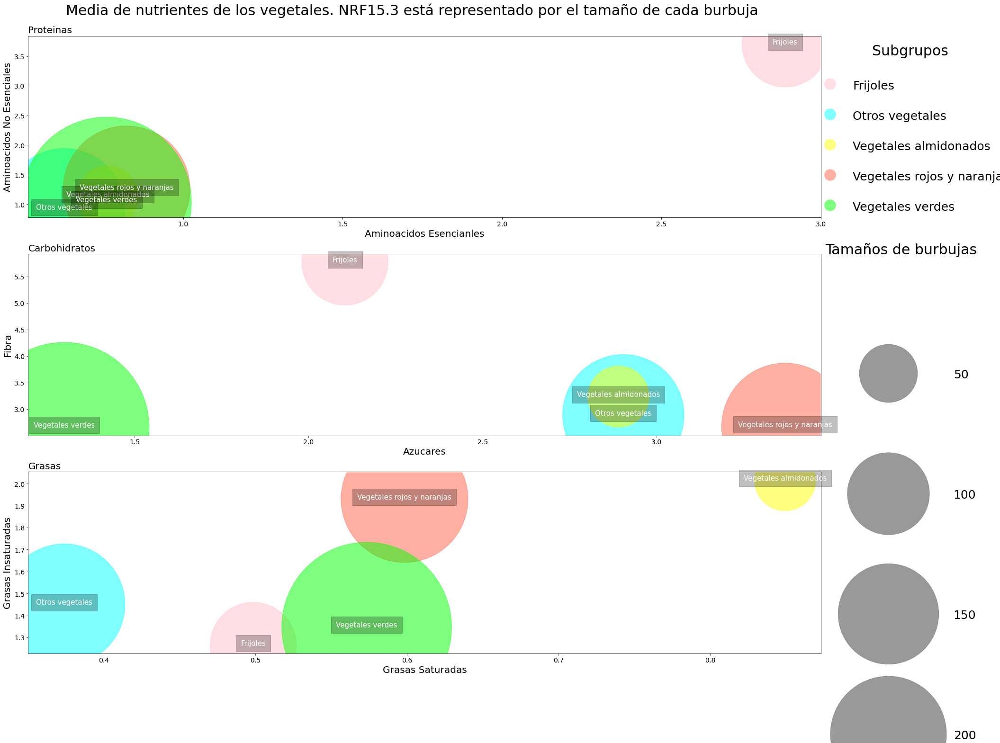

In [41]:
# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(30, 24))
params = {'xtick.labelsize': 14, 'ytick.labelsize': 14}
mpl.rcParams.update(params)
colores = ['pink','aqua', 'yellow','tomato','lime']

# Most basic bubble plot
axs[0].scatter(
    x=df_subgrupo_veg['aminoacidos_esenciales'],
    y=df_subgrupo_veg['aas_no_esenciales'],
    s= df_subgrupo_veg['NRF15.3']*300,
    c=colores,
    alpha=0.5)

axs[0].set_title('Proteinas', fontsize=20, loc='left')
axs[0].set_xlabel('Aminoacidos Esencianles', fontsize=20)
axs[0].set_ylabel('Aminoacidos No Esenciales', fontsize=20)
fig.suptitle('Media de nutrientes de los vegetales. NRF15.3 está representado por el tamaño de cada burbuja', fontsize=30, y=0.92)

for i, row in df_subgrupo_veg.iterrows():
    axs[0].text(row['aminoacidos_esenciales'], row['aas_no_esenciales'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')
    
axs[1].scatter(
    x=df_subgrupo_veg['sugars_g'],
    y=df_subgrupo_veg['fiber_g'],
    s= df_subgrupo_veg['NRF15.3']*300,
    c=colores,
    alpha=0.5)

axs[1].set_title('Carbohidratos', fontsize=20, loc='left')
axs[1].set_xlabel('Azucares', fontsize=20)
axs[1].set_ylabel('Fibra', fontsize=20)

for i, row in df_subgrupo_veg.iterrows():
    axs[1].text(row['sugars_g'], row['fiber_g'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')

axs[2].scatter(
    x=df_subgrupo_veg['saturated_fatty_acids_g'],
    y=df_subgrupo_veg['grasas_insaturadas_g'],
    s= df_subgrupo_veg['NRF15.3']*300,
    c=colores,
    alpha=0.5)

axs[2].set_title('Grasas', fontsize=20, loc='left')
axs[2].set_xlabel('Grasas Saturadas', fontsize=20)
axs[2].set_ylabel('Grasas Insaturadas', fontsize=20)

for i, row in df_subgrupo_veg.iterrows():
    axs[2].text(row['saturated_fatty_acids_g'], row['grasas_insaturadas_g'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')


#Legends
legend_labels = ['Frijoles', 'Otros vegetales', 'Vegetales almidonados', 'Vegetales rojos y naranjas', 'Vegetales verdes']
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=25, alpha=0.5) for color in colores]
legend = axs[0].legend(legend_elements, legend_labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Subgrupos', labelspacing= 4, frameon= False)
legend.set_title('Subgrupos', prop={'size': 30})

# Bubble Sizes Legend
sizes = [50, 100, 150, 200]  
sizes_labels = ['50', '100', '150', '200']
sizes_elements = [plt.scatter([], [], s=size * 300, color='gray', alpha=0.8) for size in sizes]
sizes_legend = axs[1].legend(sizes_elements, sizes_labels, loc='center left', bbox_to_anchor=(1, -0.3), title='Tamaños', labelspacing=23, frameon= False)
sizes_legend.set_title('Tamaños de burbujas', prop={'size': 30})

# # Adjust the size of the caption title
for label in legend.get_texts():
    label.set_fontsize(25)
    label.set_va('center')
    label.set_ha('left')
    label.set_x(30)
for label in sizes_legend.get_texts():
    label.set_fontsize(25)
    label.set_va('center')
    label.set_ha('left')
    label.set_x(120)
    

plt.show()

## Grains

In [42]:
df_subgrupo_grano= df[df['Grupo']=='Granos']

df_subgrupo_grano= df_subgrupo_grano.groupby('Subgrupo').mean()

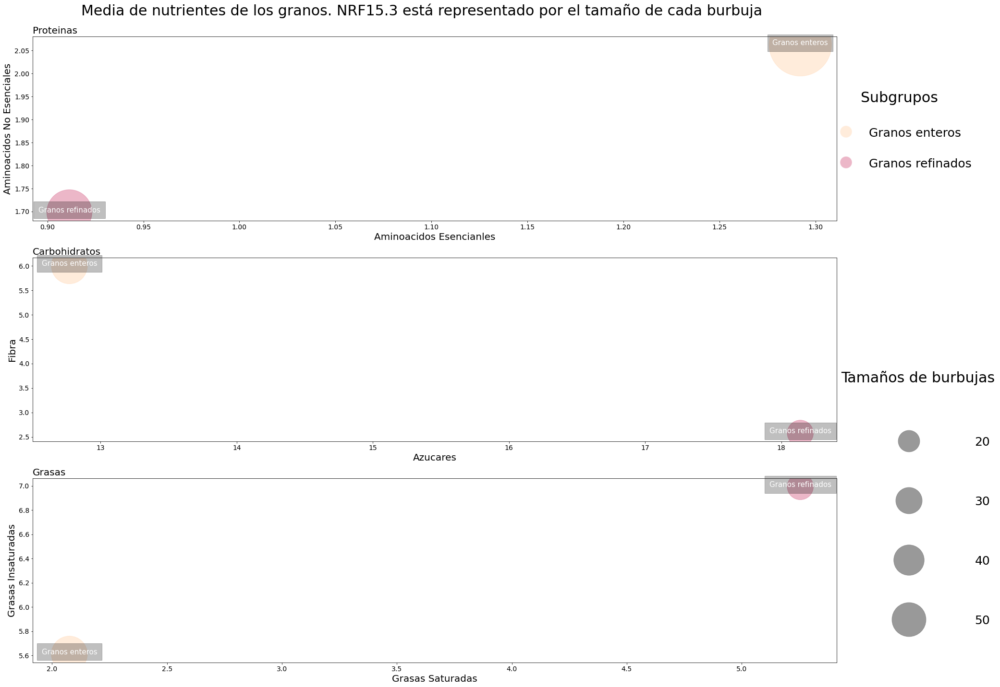

In [43]:
# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(30, 24))
params = {'xtick.labelsize': 14, 'ytick.labelsize': 14}
mpl.rcParams.update(params)
colores = ['peachpuff', 'palevioletred']

# Most basic bubble plot
axs[0].scatter(
    x=df_subgrupo_grano['aminoacidos_esenciales'],
    y=df_subgrupo_grano['aas_no_esenciales'],
    s= df_subgrupo_grano['NRF15.3']*300,
    c=colores,
    alpha=0.5)

axs[0].set_title('Proteinas', fontsize=20, loc='left')
axs[0].set_xlabel('Aminoacidos Esencianles', fontsize=20)
axs[0].set_ylabel('Aminoacidos No Esenciales', fontsize=20)
fig.suptitle('Media de nutrientes de los granos. NRF15.3 está representado por el tamaño de cada burbuja', fontsize=30, y=0.92)

for i, row in df_subgrupo_grano.iterrows():
    axs[0].text(row['aminoacidos_esenciales'], row['aas_no_esenciales'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')


    
axs[1].scatter(
    x=df_subgrupo_grano['sugars_g'],
    y=df_subgrupo_grano['fiber_g'],
    s= df_subgrupo_grano['NRF15.3']*100,
    c=colores,
    alpha=0.5)

axs[1].set_title('Carbohidratos', fontsize=20, loc='left')
axs[1].set_xlabel('Azucares', fontsize=20)
axs[1].set_ylabel('Fibra', fontsize=20)

for i, row in df_subgrupo_grano.iterrows():
    axs[1].text(row['sugars_g'], row['fiber_g'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')

    
    
axs[2].scatter(
    x=df_subgrupo_grano['saturated_fatty_acids_g'],
    y=df_subgrupo_grano['grasas_insaturadas_g'],
    s= df_subgrupo_grano['NRF15.3']*100,
    c=colores,
    alpha=0.5)

axs[2].set_title('Grasas', fontsize=20, loc='left')
axs[2].set_xlabel('Grasas Saturadas', fontsize=20)
axs[2].set_ylabel('Grasas Insaturadas', fontsize=20)

for i, row in df_subgrupo_grano.iterrows():
    axs[2].text(row['saturated_fatty_acids_g'], row['grasas_insaturadas_g'], i, fontsize=15, color='white',bbox={'facecolor':'black', 'pad':10, 'alpha':0.25}, horizontalalignment='center')



#Legends
legend_labels = ['Granos enteros', 'Granos refinados']
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=25, alpha=0.5) for color in colores]
legend = axs[0].legend(legend_elements, legend_labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Subgrupos', labelspacing= 4, frameon= False)
legend.set_title('Subgrupos', prop={'size': 30})

# Bubble Sizes Legend
sizes = [20, 30, 40, 50]  
sizes_labels = ['20', '30', '40', '50']
sizes_elements = [plt.scatter([], [], s=size * 100, color='gray', alpha=0.8) for size in sizes]
sizes_legend = axs[1].legend(sizes_elements, sizes_labels, loc='center left', bbox_to_anchor=(1, -0.3), title='Tamaños', labelspacing=10, frameon= False)
sizes_legend.set_title('Tamaños de burbujas', prop={'size': 30})

# Adjust the size of the caption title

for label in legend.get_texts():
    label.set_fontsize(25)
    label.set_va('center')
    label.set_ha('left')
    label.set_x(30)
for label in sizes_legend.get_texts():
    label.set_fontsize(25)
    label.set_va('center')
    label.set_ha('left')
    label.set_x(120)


plt.show()

# Drop brands

In [44]:
#Reset index
df=df.reset_index()

# Create a buckup if we want use it in other moment
df_marcas = df.copy()

# Filter foods that contain brand names (at least two capital letters in a row)
marcas = df[df['name'].str.contains(r'.*([A-Z]){2,}.*', regex=True)]

# Remove those foods from the original DataFrame
df = df[~df['name'].isin(marcas['name'])]

#Reset index
df.reset_index(drop=True, inplace=True)

---

# Protein analysis

They are the fundamental pillars of life. Protein is necessary in the diet to help the body repair cells and make new cells. Each gram of protein provides 4kcal of energy.
They can be classified according to their biological value:
* High biological value: contain the 9 essential amino acids
* Low biological value: they do not contain (or in very little quantity) the essential amino acids

**Amino acids**
The basic structure of protein is a chain of amino acids. The human body needs a large number of amino acids in large enough amounts to maintain good health.
These can be classified into:

* Essential: they are not synthesized by the body, they must be included in the diet
* Non-essential: they are synthesized by the body, a direct intake is not necessary

The essentials are found mainly in animal sources such as meats, milk, fish, and eggs, and the non-essentials, mainly in plant sources such as soybeans, beans, legumes, nut butters, and some grains. Although the essentials cannot be missing from the diet (since the body itself does not produce them), the non-essentials also provide many benefits.
Although amino acids are part of proteins, additional benefits can also be obtained by consuming isolated amino acids, since they serve various functions. In addition, some people have problems digesting protein (especially when the adequate amount for each person is exceeded), which is why the consumption of isolated amino acids is sometimes chosen.

See the [data dictionary](https://docs.google.com/document/d/1DQCdCmmmADNysRZ90HWcNy72WSptoQNMF0aBnGcgIbk/edit) for more details

In [45]:
df['aminoacidos_totales']= df['aminoacidos_esenciales']+df['aas_no_esenciales']

In [46]:
# Select food to charts

alimentos_seleccionados = df[
    (df['name'].isin(['Egg, fresh, raw, whole',
                        'Soybeans, raw, mature seeds',
                        'Nuts, almonds',
                        'Chicken, fried, cooked, giblets, broilers or fryers',
                        'Beef, braised, cooked, choice, separable lean and fat, chuck for stew',
                        'Chickpeas (garbanzo beans, bengal gram), raw, mature seeds']))]

In [47]:
# Select relevant columns
alimentos_seleccionados = alimentos_seleccionados[['name', 'aminoacidos_esenciales', 'aas_no_esenciales']]

# Rename columns
alimentos_seleccionados.rename(columns={'name':'Alimento','aminoacidos_esenciales': 'Esenciales', 'aas_no_esenciales': 'No esenciales'}, inplace=True)


In [48]:
# Change the names of the food
alimentos_seleccionados["Alimento"][alimentos_seleccionados["Alimento"] == "Nuts, almonds"] = "Almendras"
alimentos_seleccionados["Alimento"][alimentos_seleccionados["Alimento"] == "Soybeans, raw, mature seeds"] = "Soja"
alimentos_seleccionados["Alimento"][alimentos_seleccionados["Alimento"] == "Egg, fresh, raw, whole"] = "Huevo"
alimentos_seleccionados["Alimento"][alimentos_seleccionados["Alimento"] == "Chicken, fried, cooked, giblets, broilers or fryers"] = "Pollo"
alimentos_seleccionados["Alimento"][alimentos_seleccionados["Alimento"] == "Chickpeas (garbanzo beans, bengal gram), raw, mature seeds"] = "Garbanzos"
alimentos_seleccionados["Alimento"][alimentos_seleccionados["Alimento"] == "Beef, braised, cooked, choice, separable lean and fat, chuck for stew"] = "Carne de vaca"

# Order by essential amino acids
alimentos_seleccionados.sort_values(by='Esenciales', inplace=True)
alimentos_seleccionados= round(alimentos_seleccionados, 2)

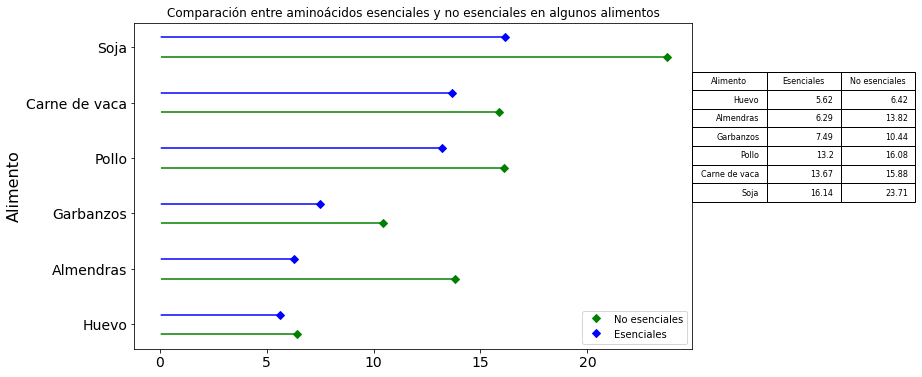

In [49]:
plt.figure(figsize=(10, 6))

# Create an array of indices for the position of the bars
indices = np.arange(len(alimentos_seleccionados))

# Width
bar_width = 0.35

# Plot the Non-essential with stem plot
plt.stem(indices - bar_width / 2, alimentos_seleccionados['No esenciales'], linefmt='g', markerfmt='Dg', basefmt='w', label='No esenciales',orientation='horizontal')

# Graph the Essentials  with stem plot
plt.stem(indices + bar_width / 2, alimentos_seleccionados['Esenciales'], linefmt='b', markerfmt='Db', basefmt='w', label='Esenciales',orientation='horizontal' )

# Fit y-axis labels and title
plt.yticks(indices, alimentos_seleccionados['Alimento'])
plt.ylabel("Alimento", fontsize=16)
plt.title("Comparación entre aminoácidos esenciales y no esenciales en algunos alimentos")

# Add legend
plt.legend()

# Show table
plt.table(cellText=alimentos_seleccionados.values, colLabels=alimentos_seleccionados.columns, bbox = [1, 0.45, 0.4, 0.4])

# Show graph
plt.show()



**Which foods are considered high in protein?** There are different criteria and points of view regarding what is considered high in protein. Here we are going to consider foods high in protein as those in which proteins provide at least 20% of the energy value of the food.
For example, for 'Egg, dried, white' (dehydrated egg white) per 100 grams:

* total calories: 382kcal.
* protein: 81.1 grams (81.1x4= 324kcal) ---> 324/383= 84% of total calories come from protein
* fat: 0 grams
* carbohydrates: 7.80 grams

Source: https://ec.europa.eu/food/safety/labelling-and-nutrition/nutrition-and-health-claims/nutrition-claims_en

In [50]:
# Select data with  proteína_porcentaje greater than or equal to 0.2.
protein20 = df[df['proteina_porcentaje'] >= 0.2]


## Protein Wordcloud

In [51]:
#!python -m spacy download en_core_web_sm

In [52]:
nlp = spacy.load('en_core_web_sm')

In [53]:
# Function to filter out nouns and proper nouns
def filter_nouns_and_proper_nouns(text):
    doc = nlp(text)
    return [token.text for token in doc if token.pos_ in ['NOUN', 'PROPN']]

In [54]:
# Apply the function to the "name" column of the DataFrame
protein20['words'] = protein20['name'].apply(filter_nouns_and_proper_nouns)

In [55]:
# Get the frequency of each word
word_freq = protein20['words'].explode().str.lower().value_counts().reset_index()
word_freq.columns = ['word', 'freq']

In [56]:
# Filter out unwanted words
words = word_freq[~word_freq['word'].isin(['lean', 'fat', 'in', '%'])]

In [57]:
# Filter by minimum and maximum frequency
words = words[(words['freq'] >= 40) & (words['freq'] <= 1000)]

In [58]:
words

,word,freq
1,boneless,476
2,meat,469
3,steak,398
4,pork,344
6,choice,330
...,...,...
64,patty,48
65,salmon,44
66,sodium,42
67,brisket,41


In [59]:
# Convert to dict 
nube = dict(zip(words['word'].tolist(), words['freq'].tolist()))

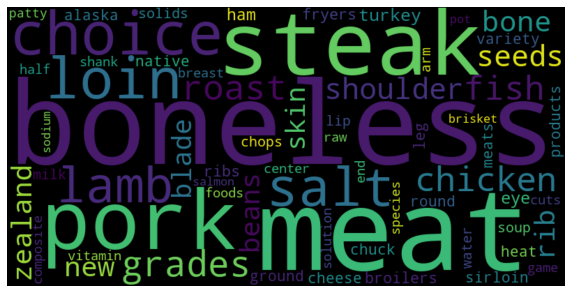

In [60]:
wc = WordCloud(width=800, height=400, max_words=200).generate_from_frequencies(nube)

plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

## High Protein

**Which high-protein foods are especially recommended to consume?** <br/>
Basically the ones that are also high in amino acids, especially the essential ones since they are the ones that the body does not produce on its own.

In [61]:
# Create new columns to visualize
df['protein_g_w'] = df['protein_g'].clip(lower=df['protein_g'].quantile(0.01), upper=df['protein_g'].quantile(0.99))
df['AminTotal_g_w'] = df['aminoacidos_esenciales'].clip(lower=df['aminoacidos_esenciales'].quantile(0.01), upper=df['aminoacidos_esenciales'].quantile(0.99))


In [62]:
# Labels
huevo = protein20[protein20['name'] == 'Egg, fresh, raw, whole']
garbanzos = protein20[protein20['name'] == 'Chickpeas (garbanzo beans, bengal gram), raw, mature seeds']
carnevaca = protein20[protein20['name'] == 'Beef, braised, cooked, choice, separable lean and fat, chuck for stew']

In [63]:
# Visualization
fig = px.scatter(
    df,
    x='protein_g_w',
    y='AminTotal_g_w',
    color='NRF15.3Wins',
    opacity=0.8,
    symbol='Grupo',
    labels={'protein_g_w': 'Proteína (en gramos) - Winsorized', 'AminTotal_g_w': 'Total aminoácidos (en gramos) - Winsorized'},
    hover_data={'name':True,'protein_g_w': True, 'AminTotal_g_w': True, 'NRF15.3Wins': True, 'Grupo': True}
)

fig.update_layout(
     title={
        'text': 'Alimentos altos en proteina',
        'x': 0.6,  
        'xanchor': 'center' 
    },
    legend=dict(
        x=-0.4,      # Change this value to adjust the horizontal position
        y=1,    # Change this value to adjust the vertical position 
        bgcolor='white',  # Background color of the legend
        title=dict(text='<b> Seleccione grupo(s): </b>')  # Title of the legend
    )
)

fig.add_hline(y=0, opacity=0.15,  line_color="red", line_width=10)

# Add Text
fig.add_annotation(
    text="Bajos en aminoácidos",
    x=33, y=0.75,
    xref="x", yref="y",
    showarrow=False,
    font=dict(color="red", size=16)
)

annotations = [
    dict(
        x=huevo['protein_g'].values[0],  #Use the numeric value instead of the DataFrame
        y=huevo['aminoacidos_esenciales'].values[0],     # Use the numeric value instead of the DataFrame
        text="Huevos",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    ),
    dict(
        x=garbanzos['protein_g'].values[0],  #Use the numeric value instead of the DataFrame
        y=garbanzos['aminoacidos_esenciales'].values[0],     #Use the numeric value instead of the DataFrame
        text="Garbanzos",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    ),
    dict(
        x=carnevaca['protein_g'].values[0],  #Use the numeric value instead of the DataFrame
        y=carnevaca['aminoacidos_esenciales'].values[0],     #Use the numeric value instead of the DataFrame
        text="Carne de vaca",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    )
]

# Add annotations
for annotation in annotations:
    fig.add_annotation(**annotation)
# Show the plot
fig.show()

**What are the branched chain amino acids (BCAAs) and how are they related to the increase in muscle mass?** <br/>
It is common for people who are on a muscle mass gain regimen to consume a lot of protein as they provide what is necessary for this to happen. In some cases they even consume protein shakes with 40/50 grams of protein (or more). Broadly speaking, it works like this, however it has been proven that consuming excess protein over a long period of time has negative effects on health, mainly affecting the liver and kidneys.<br/>
How much is an excess of protein depends on each organism, its activities, what other things it consumes, its lifestyle, etc.<br/>

**Branched Chain Amino Acids (BCAAs)** is the combination of three essential amino acids (**valine, isoleucine and leucine**) that make up almost a third of the skeletal muscles in the human body and play a very important role in the synthesis of protein.<br/>
For people who are on a regimen to increase muscle mass, it is usually recommended to consume this group of amino acids in isolation since they are very important for muscle repair (especially leucine, at least 2.5 grams daily is recommended ), without the negative effects of excessive protein consumption.<br/>
They are found especially in meats, dairy products and legumes.

In [64]:
# Create columns to visualize

df['BCAA_g_w'] = df['BCAA_g'].clip(lower=df['BCAA_g'].quantile(0.0), upper=df['BCAA_g'].quantile(0.99))
bcaa2 = df[df['proteina_porcentaje'] >= 0.2]
bcaa2 = bcaa2[bcaa2['BCAA_g'] >= 2]
bcaa2 = bcaa2[bcaa2['Grupo'] != 'Frutas']

In [65]:
# Visualization 
fig_BCAA = px.scatter(
    bcaa2,
    x='protein_g_w',
    y='BCAA_g_w',
    color='NRF15.3Wins',
    opacity=0.8,
    symbol='Grupo',
    labels={'protein_g_w': 'Proteína (en gramos) - Winsorized', 'BCAA_g_w': 'BCAA (en gramos) - Winsorized'},
    hover_data={'name':True,'protein_g_w': True, 'AminTotal_g_w': True, 'NRF15.3Wins': True, 'Grupo': True}
)

fig_BCAA.update_layout(
     title={
        'text': 'Alimentos altos en proteinas y BCAA',
        'x': 0.6,  
        'xanchor': 'center' 
    },
    legend=dict(
        x=-0.4,      # Change this value to adjust the horizontal position
        y=1,    # Change this value to adjust the vertical position 
        bgcolor='white',  # Background color of the legend
        title=dict(text='<b> Seleccione grupo(s): </b>')  # Title of the legend
    )
)

# Show the plot
fig_BCAA.show()

# Carbs analysis

They are sugar molecules. Along with protein and fat, they are one of the three main nutrients found in food.
In the body, carbohydrates are broken down into glucose, which is the main source of energy for the body's cells, tissues, and organs. It can be used immediately or stored in the liver and muscles for later use. They provide 4kcal per gram
There are two main types:

* simple (sugars): composed mainly of sugars.
* complexes (starches and fiber): provide fiber, vitamins, minerals and sugars. They do not rapidly increase blood sugar levels (in general they are low glycemic index)

It is generally recommended to reduce the consumption of the simple and increase the consumption of the complex.

See the [data dictionary](https://docs.google.com/document/d/1DQCdCmmmADNysRZ90HWcNy72WSptoQNMF0aBnGcgIbk/edit) for more details

In [66]:
# Select food to charts
alimentos_seleccionados_ch = df[
    (df['name'].isin(['Bread, whole-wheat, pita', 'Apples, with skin, red delicious, raw',
                      'Cereals ready-to-eat, chocolate-flavored frosted puffed corn', 'Cocoa, unsweetened, dry powder',
                      'Soybeans, raw, mature seeds','Carrot, dehydrated']))]

In [67]:
# Select relevant columns
alimentos_seleccionados_ch = alimentos_seleccionados_ch[['name', 'sugars_g', 'fiber_g']]

# Rename columns
alimentos_seleccionados_ch.rename(columns={'name':'Alimento','sugars_g': 'Azucares', 'fiber_g': 'Fibra'}, inplace=True)


In [68]:
# Rename food
alimentos_seleccionados_ch["Alimento"][alimentos_seleccionados_ch["Alimento"] == "Bread, whole-wheat, pita"] = "Pan pita integral"
alimentos_seleccionados_ch["Alimento"][alimentos_seleccionados_ch["Alimento"] == "Apples, with skin, red delicious, raw"] = "Manzana 'deliciosa'"
alimentos_seleccionados_ch["Alimento"][alimentos_seleccionados_ch["Alimento"] == "Cereals ready-to-eat, chocolate-flavored frosted puffed corn"] = "Cereal sabor chocolate"
alimentos_seleccionados_ch["Alimento"][alimentos_seleccionados_ch["Alimento"] == "Cocoa, unsweetened, dry powder"] = "Cacao (puro)"
alimentos_seleccionados_ch["Alimento"][alimentos_seleccionados_ch["Alimento"] == "Soybeans, raw, mature seeds"] = "Granos de soja"
alimentos_seleccionados_ch["Alimento"][alimentos_seleccionados_ch["Alimento"] == "Carrot, dehydrated"] = "Zanahoria deshidratada"

alimentos_seleccionados_ch.sort_values(by='Azucares', inplace=True)#ordenamos por aminoacidos esenciales
alimentos_seleccionados_ch= round(alimentos_seleccionados_ch, 2)

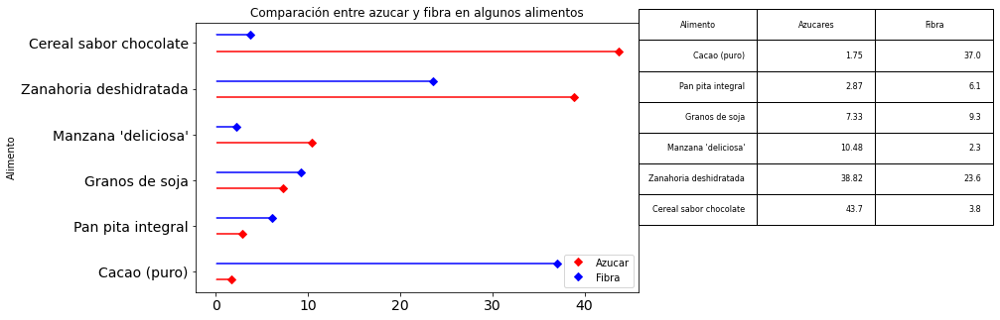

In [69]:
plt.figure(figsize=(8, 5))

# Create an array of indices for the position of the bars
indices = np.arange(len(alimentos_seleccionados_ch))

# Width
bar_width = 0.35

# Plot Azucares with stem
plt.stem(indices - bar_width / 2, alimentos_seleccionados_ch['Azucares'], linefmt='red', markerfmt='Dr', basefmt='w', label='Azucar',orientation='horizontal')

# Plot Fibra with stem
plt.stem(indices + bar_width / 2, alimentos_seleccionados_ch['Fibra'], linefmt='b', markerfmt='Db', basefmt='w', label='Fibra',orientation='horizontal' )

# Fit y-axis labels and title
plt.yticks(indices, alimentos_seleccionados_ch['Alimento'])
plt.ylabel("Alimento")
plt.title("Comparación entre azucar y fibra en algunos alimentos")

# Add legend 
plt.legend()

# Show table
plt.table(cellText=alimentos_seleccionados_ch.values, colLabels=alimentos_seleccionados_ch.columns, bbox = [1, 0.25, 0.8, 0.8])

# Show graph
plt.show()



**Which foods are considered high in carbohydrates?** There are different criteria and points of view regarding what is considered high. One of the most accepted is to consider foods high in carbohydrates to those where carbohydrates provide at least 20% of the energy value of the food.
For example, for 100 grams of parboiled white rice('Rice, dry, enriched, parboiled, long-grain, white'):

* total calories: 374kcal
* protein: 7.51 grams
* fat: 1.03 grams
* carbohydrates: 80.89 grams (80.89x4=323kcal) ---> (323/374)*100= 86% of total calories come from carbohydrates

## Carb Wordcloud

In [70]:
#Select data with carbs_porcentaje greater than or equal to 0.2.
carb20= df[df['carbs_porcentaje'] >= 0.2]

In [71]:
#funcion filter_nouns_and_proper_nouns
carb20['words'] = carb20['name'].apply(filter_nouns_and_proper_nouns)

In [72]:
# Get the frequency of each word
carb_freq = carb20['words'].explode().str.lower().value_counts().reset_index()
carb_freq.columns = ['word', 'freq']

In [73]:
# Filter out unwanted words
carb_freq = carb_freq[~carb_freq['word'].isin(['%'])]

In [74]:
# Filter by minimum and maximum frequency
carb_freq = carb_freq[(carb_freq['freq'] >= 70) & (carb_freq['freq'] <= 200)]

In [75]:
nube_carb = dict(zip(carb_freq['word'].tolist(), carb_freq['freq'].tolist()))

In [76]:
nube_carb

{'beans': 196,
 'milk': 193,
 'soup': 174,
 'beverages': 166,
 'chocolate': 163,
 'solids': 149,
 'juice': 143,
 'fruit': 133,
 'water': 133,
 'rice': 129,
 'cheese': 120,
 'corn': 119,
 'snacks': 115,
 'liquids': 113,
 'bread': 106,
 'foods': 103,
 'potatoes': 103,
 'wheat': 101,
 'cream': 94,
 'chicken': 91,
 'vitamin': 91,
 'pack': 90,
 'flour': 86,
 'cookies': 81,
 'sauce': 80,
 'type': 77,
 'beef': 75,
 'syrup': 73,
 'recipe': 71,
 'grain': 71}

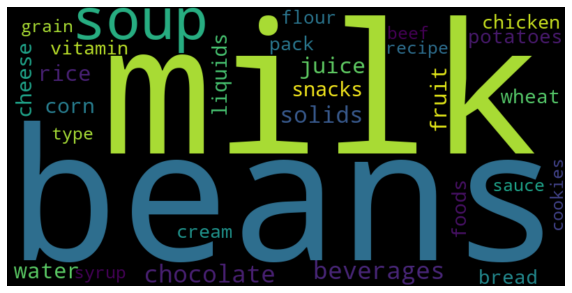

In [77]:
wc_carb = WordCloud(width=800, height=400, max_words=200).generate_from_frequencies(nube_carb)

plt.figure(figsize=(10, 10))
plt.imshow(wc_carb, interpolation='bilinear')
plt.axis('off')
plt.show()

## High Carbs

**What are the foods high in carbohydrates that are most recommended to consume?**

Broadly speaking, those that are to the left of the orange line, since they provide less than 15 grams of sugar per 100 grams of food.
https://www.nhs.uk/live-well/eat-well/how-to-read-food-labels/

In [78]:
df= df.rename(columns={'NRF15.3': 'NRF15_3'})

In [79]:
# Create new columns to visualize

df['fiber_g_w'] = df['fiber_g'].clip(lower=df['fiber_g'].quantile(0.0), upper=df['fiber_g'].quantile(0.99))
df['sugar_g_w'] = df['sugars_g'].clip(lower=df['sugars_g'].quantile(0.0), upper=df['sugars_g'].quantile(0.99))
carb20 = df[df['carbs_porcentaje'] >= 0.2]

In [80]:
# Labels
cereal = carb20[carb20['name'] == 'Cereals ready-to-eat, chocolate-flavored frosted puffed corn']
manzana = carb20[carb20['name'] == 'Apples, with skin, red delicious, raw']
soja = carb20[carb20['name'] == 'Soybeans, raw, mature seeds']

In [81]:
# Visualization
fig = px.scatter(
    carb20,
    x='sugar_g_w',
    y='fiber_g_w',
    color='NRF15.3Wins',
    opacity=0.8,
    symbol='Grupo',
    labels={'sugar_g_w': 'Azúcares (en gramos) - Winsorized', 'fiber_g_w': 'Fibra (en gramos) - Winsorized'},
    hover_data=['name', 'Grupo', 'Subgrupo'])  

fig.update_layout(
    legend=dict(
        x=-0.25,      # Change this value to adjust the horizontal position (0 = left, 1 = right)
        y=1,    # Change this value to adjust the vertical position (0 = bottom, 1 = top)
        bgcolor='white',  # Background color of the legend
        title=dict(text='<b> Seleccione grupo(s): </b>')  # Title of the legend
    )
)

fig.add_vline(x=15, line_dash="dash", line_color="orange")

# Add text
fig.add_annotation(
    text="Altos en Azúcares",
    x=25, y=17,
    xref="x", yref="y",
    showarrow=False,
    font=dict(color="orange", size=16)
)

#Add arrow
fig.add_annotation(
    text="",  # No text
    x=30, y=16,  # Arrow position
    ax=-100,  
    ay=0,  
    arrowhead=2,  
    arrowsize=2,  
    arrowcolor="orange"
)

annotations = [
    dict(
        x=cereal['sugar_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=cereal['fiber_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Cereal",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    ),
    dict(
        x=manzana['sugar_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=manzana['fiber_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Manzana",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    ),
    dict(
        x=soja['sugar_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=soja['fiber_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Soja",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    )
]

# Add annotations
for annotation in annotations:
    fig.add_annotation(**annotation)
# Show the plot
fig.show()

**What foods should I consider for a high fiber diet?**

All those that provide at least 6 grams of fiber per 100 grams of food (although it should be clarified, after 3 grams, the food is considered a good source of fiber).

In [82]:
fiber6 = df[(df['fiber_g'] > 6) & (df['carbs_porcentaje'] >= 0.2)]

In [83]:
# Labels
cacao = fiber6[fiber6['name'] == 'Cocoa, unsweetened, dry powder']
panpita = fiber6[fiber6['name'] == 'Bread, whole-wheat, pita']
zanahoria = fiber6[fiber6['name'] == 'Carrot, dehydrated']

In [84]:
#Visualization
fig = px.scatter(
    fiber6,
    x='sugar_g_w',
    y='fiber_g_w',
    color='NRF15.3Wins',
    opacity=0.8,
    symbol='Grupo',
    labels={'sugar_g_w': 'Azúcares (en gramos) - Winsorized', 'fiber_g_w': 'Fibra (en gramos) - Winsorized'},
    hover_data=['name','Grupo', 'Subgrupo'])  # Otras columnas para mostrar en el tooltip

fig.update_layout(
    legend=dict(
        x=-0.25,      
        y=1,    
        bgcolor='white',  
        title=dict(text='<b> Seleccione grupo(s): </b>')  
    )
)

fig.add_vline(x=15, line_dash="dash", line_color="orange")

# Add text
fig.add_annotation(
    text="Altos en Azúcares",
    x=25, y=17,
    xref="x", yref="y",
    showarrow=False,
    font=dict(color="orange", size=16)
)

#Add arrow
fig.add_annotation(
    text="",  # No text
    x=30, y=16,  # Arrow position
    ax=-100,  
    ay=0,  
    arrowhead=2,  
    arrowsize=2,  
    arrowcolor="orange"
)

annotations = [
    dict(
        x=cacao['sugar_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=cacao['fiber_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Cacao",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    ),
    dict(
        x=panpita['sugar_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=panpita['fiber_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Pan de pita",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    ),
    dict(
        x=zanahoria['sugar_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=zanahoria['fiber_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Zanahoria",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    )
]

# Add annotation
for annotation in annotations:
    fig.add_annotation(**annotation)
# Show the plot
fig.show()


# Fats

Fat is one of the macronutrients that must be present in the diet. It is essential to protect the organs, absorb fat-soluble vitamins (A, D, E, and K), regulate hormone production, and much more. They provide 9kcal per gram

All fats are made up of saturated and unsaturated fatty acids. Their name depends on how much of each type of fatty acid they contain.
In general terms, it is usually recommended to reduce saturated fats, and have a recommended level of unsaturated fats.

See the [data dictionary](https://docs.google.com/document/d/1DQCdCmmmADNysRZ90HWcNy72WSptoQNMF0aBnGcgIbk/edit) for more details

In [85]:
# Select food to charts

alimentos_seleccionados_fat = df[
    (df['name'].isin(['Nuts, pecans','Cheese, roquefort', 'Oil, salad or cooking, olive', 'Oil, coconut',
                       "Baking chocolate, squares, unsweetened", "Peanut butter, without salt, chunk style"]))]


In [86]:
# Select relevant columns
alimentos_seleccionados_fat = alimentos_seleccionados_fat[['name', 'saturated_fatty_acids_g','grasas_insaturadas_g','fatty_acids_total_trans_mg']]

In [87]:
# Rename columns
alimentos_seleccionados_fat.rename(columns={'name':'Alimento','saturated_fatty_acids_g':'Grasas saturadas(g)', 'grasas_insaturadas_g': 'Grasas insaturadas(g)', 'fatty_acids_total_trans_mg': 'Grasas trans(mg)'}, inplace=True)

In [88]:
# Rename food
alimentos_seleccionados_fat["Alimento"][alimentos_seleccionados_fat["Alimento"] == "Oil, salad or cooking, olive"] = "Aceite de oliva"
alimentos_seleccionados_fat["Alimento"][alimentos_seleccionados_fat["Alimento"] == "Nuts, pecan"] = "Nueces pecan'"
alimentos_seleccionados_fat["Alimento"][alimentos_seleccionados_fat["Alimento"] == "Peanut butter, without salt, chunk style"] = "Mantequilla de cacahuetes"
alimentos_seleccionados_fat["Alimento"][alimentos_seleccionados_fat["Alimento"] == "Cheese, roquefort"] = "Roquefort"
alimentos_seleccionados_fat["Alimento"][alimentos_seleccionados_fat["Alimento"] == "Oil, coconut"] = "Aceite de coco"
alimentos_seleccionados_fat["Alimento"][alimentos_seleccionados_fat["Alimento"] == "Baking chocolate, squares, unsweetened"] = "Chocolate de reposteria"

alimentos_seleccionados_fat.sort_values(by='Grasas saturadas(g)', inplace=True)#ordenamos por aminoacidos esenciales
alimentos_seleccionados_fat= round(alimentos_seleccionados_fat, 2)

In [89]:
alimentos_seleccionados_fat= alimentos_seleccionados_fat.reset_index()

In [90]:
alimentos_seleccionados_fat= alimentos_seleccionados_fat.drop(['index'], axis=1)

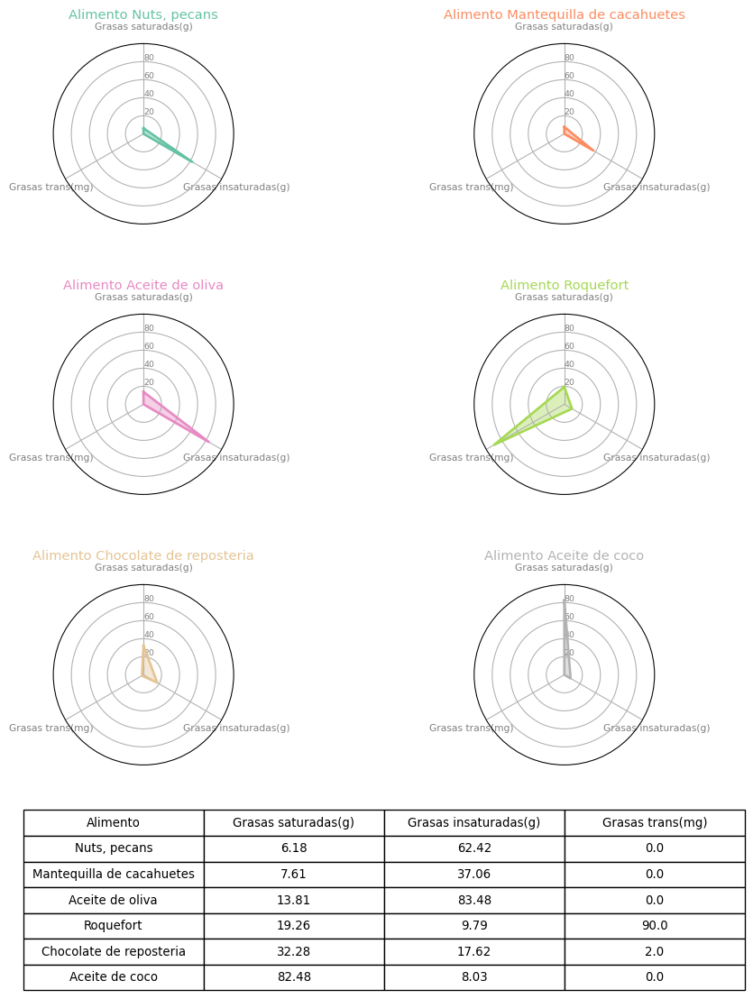

In [91]:
# Define a function that do a plot for one line of the dataset!
 
def make_spider(row, title, color):

    # number of variable
    categories=list(alimentos_seleccionados_fat)[1:]
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(3,2,row+1, polar=True, )

    # If you want the first axis to be on top:
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([20,40,60,80], ["20","40","60","80"], color="grey", size=7)
    plt.ylim(0,100)

    # Ind1
    values=alimentos_seleccionados_fat.loc[row].drop('Alimento').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    plt.title(title, size=11, color=color, y=1.1)

    
# ------- PART 2: Apply the function to all individuals
# initialize the figure
my_dpi=96
plt.figure(figsize=(1000/my_dpi, 1000/my_dpi), dpi=my_dpi)
 
# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(alimentos_seleccionados_fat.index))
 
# Loop to plot
for row in range(0, len(alimentos_seleccionados_fat.index)):
    make_spider(row=row, title='Alimento '+alimentos_seleccionados_fat['Alimento'][row], color=my_palette(row))

plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.5, wspace=0.4)  

table= plt.table(cellText=alimentos_seleccionados_fat.values, 
          colLabels=alimentos_seleccionados_fat.columns,
        colWidths=[0.7] * 4, cellLoc='center', bbox = [-2.5, -1.25, 4, 1])

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(2, 2)
plt.show()

**What foods are considered high in fat?** <br/>
We are going to consider foods high in fat in cases where there is at least 17.5 grams of fat, every 100 grams of food.<br/>
For example, for 100 grams of nuts ('Nuts, raw, macadamia nuts'):
* total calories: 718kcal.
* protein: 7.91 grams
* fat: 76 grams
* carbohydrates: 13.82 grams

## Fat Wordcloud

In [92]:
##Select data with fat_g greater than or equal to 17.5.
fat20= df[df['fat_g'] >= 17.5]

In [93]:
#funcion filter_nouns_and_proper_nouns
fat20['words'] = fat20['name'].apply(filter_nouns_and_proper_nouns)

In [94]:
fat_freq = fat20['words'].explode().str.lower().value_counts().reset_index()
fat_freq.columns = ['word', 'freq']

In [95]:
# Filter out unwanted words
fat_freq = fat_freq[~fat_freq['word'].isin(['%'])]

In [96]:
# Filter by minimum and maximum frequency
fat_freq = fat_freq[(fat_freq['freq'] >= 40) & (fat_freq['freq'] <= 1000)]

In [97]:
nube_fat = dict(zip(words['word'].tolist(), words['freq'].tolist()))

In [98]:
nube_fat

{'boneless': 476,
 'meat': 469,
 'steak': 398,
 'pork': 344,
 'choice': 330,
 'loin': 301,
 'salt': 285,
 'lamb': 282,
 'grades': 254,
 'roast': 248,
 'chicken': 247,
 'fish': 234,
 'shoulder': 193,
 'seeds': 190,
 'bone': 183,
 'new': 172,
 'rib': 170,
 'zealand': 170,
 'beans': 165,
 'blade': 154,
 'skin': 150,
 'turkey': 145,
 'eye': 138,
 'ham': 124,
 'leg': 117,
 'fryers': 113,
 'broilers': 108,
 'ribs': 105,
 'sirloin': 99,
 'cheese': 98,
 'round': 98,
 'products': 96,
 'variety': 95,
 'meats': 95,
 'heat': 94,
 'ground': 91,
 'alaska': 89,
 'chuck': 86,
 'native': 82,
 'chops': 78,
 'soup': 77,
 'water': 75,
 'lip': 74,
 'arm': 72,
 'milk': 69,
 'solids': 69,
 'center': 64,
 'game': 62,
 'species': 62,
 'shank': 62,
 'vitamin': 60,
 'half': 59,
 'breast': 58,
 'composite': 58,
 'cuts': 57,
 'foods': 57,
 'raw': 56,
 'end': 55,
 'solution': 55,
 'patty': 48,
 'salmon': 44,
 'sodium': 42,
 'brisket': 41,
 'pot': 40}

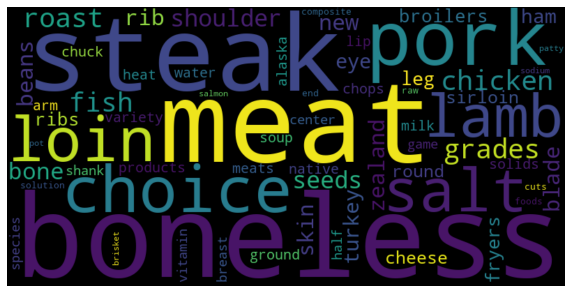

In [99]:
wc_fat = WordCloud(width=800, height=400, max_words=200).generate_from_frequencies(nube_fat)

plt.figure(figsize=(10, 10))
plt.imshow(wc_fat, interpolation='bilinear')
plt.axis('off')
plt.show()

**What high-fat foods is recommended to consume?**

As we saw previously, despite the bad reputation that fats have, they are essential for the proper functioning of the body. It is basically recommended to consume foods high in unsaturated fats (composed of monounsaturated and polyunsaturated), and if possible reduce the consumption of saturated fats and trans fats (well, actually trans fats are part of the unsaturated but let's stay with this concept).
https://www.nhs.uk/live-well/eat-well/how-to-read-food-labels/

In [100]:
df['grasas_insaturadas_g_w'] = df['grasas_insaturadas_g'].clip(lower=df['grasas_insaturadas_g'].quantile(0.0), upper=df['grasas_insaturadas_g'].quantile(0.99))
df['saturated_fatty_acids_g_w'] = df['saturated_fatty_acids_g'].clip(lower=df['saturated_fatty_acids_g'].quantile(0.0), upper=df['saturated_fatty_acids_g'].quantile(0.99))
fat20= df[df['fat_g'] >= 17.5]

In [101]:
mantequilla = fat20[fat20['name'] == 'Butter, salted']
pb = fat20[fat20['name'] == 'Peanut butter, without salt, chunk style']
parmesano = fat20[fat20['name'] == 'Cheese, hard, parmesan']

In [102]:
# VISUALIZACION
fig = px.scatter(
    fat20,
    x='saturated_fatty_acids_g_w',
    y='grasas_insaturadas_g_w',
    color='NRF15.3Wins',
    opacity=0.8,
    symbol='Grupo',
    labels={'saturated_fatty_acids_g_w': 'Grasas saturadas (en gramos) - Winsorized', 'grasas_insaturadas_g_w': 'Grasas Insaturadas (en gramos) - Winsorized'},
    hover_data=['name', 'Grupo', 'Subgrupo'])  

fig.update_layout(
    legend=dict(
        x=-0.3,      # Change this value to adjust the horizontal position (0 = left, 1 = right)
        y=1,    # Change this value to adjust the vertical position (0 = bottom, 1 = top)
        bgcolor='white',  # Background color of the legend
        title=dict(text='<b> Seleccione grupo(s): </b>')  # Title of the legend
    )
)

fig.add_vline(x=5, line_dash="dash", line_color="orange")

# Add text
fig.add_annotation(
    text="Altos en grasas saturadas",
    x=10, y=75,
    xref="x", yref="y",
    showarrow=False,
    font=dict(color="orange", size=16)
)

#Add arrow 
fig.add_annotation(
    text="",  
    x=12, y=70, 
    ax=-100, 
    ay=0,  
    arrowhead=2,  
    arrowsize=2,  
    arrowcolor="orange"
)

annotations = [
    dict(
        x=mantequilla['saturated_fatty_acids_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=mantequilla['grasas_insaturadas_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Mantequilla",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    ),
    dict(
        x=pb['saturated_fatty_acids_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=pb['grasas_insaturadas_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Mantequilla de cacahuetes",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    ),
    dict(
        x=parmesano['saturated_fatty_acids_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=parmesano['grasas_insaturadas_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Parmesano",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black',
        arrowwidth=2 
    )
]

# Add annotations
for annotation in annotations:
    fig.add_annotation(**annotation)
# Show the plot
fig.show()

## High Fats

**When is a food considered high in unsaturated fat?** <br/>
Fulfilling two conditions: the first is that at least 20% of the energy provided by food comes from unsaturated fats. The second condition is that of the total fats, at least 70% are unsaturated. <br/>
https://ec.europa.eu/food/safety/labelling-and-nutrition/nutrition-and-health-claims/nutrition-claims_en


In [103]:
df['grasas_insaturadas_porcentaje']= (df['grasas_insaturadas_g']*9)/df['calories_100g']

In [104]:
df['porcentaje_insaturada_total_grasas'] = df['grasas_insaturadas_g']/df['fat_g']

In [105]:
insaturado_alto= df[(df['porcentaje_insaturada_total_grasas'] >= 0.7) & (df['grasas_insaturadas_porcentaje'] >= 0.2)]

In [106]:
aguacate = insaturado_alto[insaturado_alto['name'] == 'Avocados, all commercial varieties, raw']
aceite_oliva = insaturado_alto[insaturado_alto['name'] == 'Oil, salad or cooking, olive']
pecans = insaturado_alto[insaturado_alto['name'] == 'Nuts, pecans']

In [107]:
# VISUALIZACION
fig = px.scatter(
    insaturado_alto,
    x='saturated_fatty_acids_g_w',
    y='grasas_insaturadas_g_w',
    color='NRF15.3Wins',
    opacity=0.8,
    symbol='Grupo',
    labels={'saturated_fatty_acids_g_w': 'Grasas saturadas (en gramos) - Winsorized', 'grasas_insaturadas_g_w': 'Grasas Insaturadas (en gramos) - Winsorized'},
    hover_data=['name', 'Grupo', 'Subgrupo']) 

fig.update_layout(
    legend=dict(
        x=-0.3,      
        y=1,    
        bgcolor='white', 
        title=dict(text='<b> Seleccione grupo(s): </b>') 
    )
)

fig.add_vline(x=5, line_dash="dash", line_color="orange")

# Add text
fig.add_annotation(
    text="Altos en grasas saturadas",
    x=10, y=5,
    xref="x", yref="y",
    showarrow=False,# No mostrar una flecha con el texto
    font=dict(color="orange", size=16)
)

#Add arrow
fig.add_annotation(
    text="",  
    x=12, y=2, 
    ax=-100,  
    ay=0,  
    arrowhead=2,  
    arrowsize=2, 
    arrowcolor="orange"
)

annotations = [
    dict(
        x=aguacate['saturated_fatty_acids_g_w'].values[0],  # Use the numeric value instead of the DataFrame
        y=aguacate['grasas_insaturadas_g_w'].values[0],     # Use the numeric value instead of the DataFrame
        text="Palta / aguacate",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black'
    ),
    dict(
        x=aceite_oliva['saturated_fatty_acids_g_w'].values[0], # Use the numeric value instead of the DataFrame
        y=aceite_oliva['grasas_insaturadas_g_w'].values[0],    # Use the numeric value instead of the DataFrame
        text="Aceite de oliva",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black'
    ),
    dict(
        x=pecans['saturated_fatty_acids_g_w'].values[0], # Use the numeric value instead of the DataFrame
        y=pecans['grasas_insaturadas_g_w'].values[0],    # Use the numeric value instead of the DataFrame
        text="Nueces pecan",
        xref="x",
        yref="y",
        showarrow=True,
        arrowhead=7,
        ax=-20,
        ay=-60,
        bgcolor='#fcfcd7',
        bordercolor='black'
    )
]

# Add annotations
for annotation in annotations:
    fig.add_annotation(**annotation)

# Show the plot
fig.show()

# Sodium in food
We consider foods high in sodium to be those in which this mineral exceeds 0.6 grams (600mg), every 100 grams of food.<br/>
https://www.nhs.uk/live-well/eat-well/how-to-read-food-labels/

In [108]:
df['sodium_mg_w'] = df['sodium_mg'].clip(lower=df['sodium_mg'].quantile(0.0), upper=df['sodium_mg'].quantile(0.99))
df['calories_100g_w'] = df['calories_100g'].clip(lower=df['calories_100g'].quantile(0.0), upper=df['calories_100g'].quantile(0.99))

In [109]:
# Visualization
fig = px.scatter(
    df,
    x='sodium_mg_w',
    y='calories_100g_w',
    color='NRF15.3Wins',
    opacity=0.8,
    symbol='Grupo',
    labels={'sodium_mg_w': 'Sodio (en mg) - Winsorized', 'calories_100g_w': 'Calorias (kcal) - Winsorized'},
    hover_data=['name', 'Grupo', 'Subgrupo'])  

fig.update_layout(
    legend=dict(
        x=-0.3,     
        y=1,    
        bgcolor='white', 
        title=dict(text='<b> Seleccione grupo(s): </b>')  
    )
)
fig.add_vline(x=600, line_dash="dash", line_color="orange")

# Add text
fig.add_annotation(
    text="Altos en sodio",
    x=600, y=820,
    xref="x", yref="y",
    showarrow=False,
    font=dict(color="orange", size=16)
)

#Add arrow
fig.add_annotation(
    text="",  
    x=900, y=815,  
    ax=-30,  
    ay=0,  
    arrowhead=2,  
    arrowsize=2, 
    arrowcolor="orange"
)

# Show the plot
fig.show()